![](https://news.usc.edu/files/2017/02/LA-Smoggy-Fog-web-824x549.jpg)

This is a live project done by Sunanda Kumar Ghosh.

The climate data will be taken from https://en.tutiempo.net/ for Bombay from 2013 - 2018 for each month for Bombay.

Activities:-
1. Data collection from multiple sources.
2. Pre-process Data (Feature Engineering).

## Interpretation

# Independent features
Note that the averages and monthly totals are based on available data, when in the middle some result in red, it means that no information is available full month, in this case, the mean or total is the days for which there are data.

1. T	Average Temperature (°C)
2. TM	Maximum temperature (°C)
3. Tm	Minimum temperature (°C)
4. SLP	Atmospheric pressure at sea level (hPa)
5. H	Average relative humidity (%)
6. PP	Total rainfall and / or snowmelt (mm)
7. VV	Average visibility (Km)
8. V	Average wind speed (Km/h)
9. VM	Maximum sustained wind speed (Km/h)
10. VG	Maximum speed of wind (Km/h)
11. RA	Indicate if there was rain or drizzle (In the monthly average, total days it rained)
12. SN	Snow indicator (In the monthly average, total days that snowed)
13. TS	Indicates whether there storm (In the monthly average, Total days with thunderstorm)
14. FG	Indicates whether there was fog (In the monthly average, Total days with fog)

# Dependent Feature

Air quality Index PM 2.5- Downloaded from weathermap.com
# Web Scraping

url for scraping:- https://en.tutiempo.net/climate/01-2013/ws-430030.html


Now we will download HTML pages which contain data into our local environment.

In [1]:
#Importing Libraries

import os
import time  #Time taken to download the pages.
import requests #It will help in downloading the pages(HTML).
import sys
import numpy as np
import matplotlib
import pandas as pd

In [2]:
!pip install scikit-learn==0.22.2

     |████████████████████████████████| 7.1 MB 45 kB/s eta 0:00:015
ERROR: pycaret 1.0.0 has requirement scikit-learn==0.22, but you'll have scikit-learn 0.22.2 which is incompatible.
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22
    Uninstalling scikit-learn-0.22:
      Successfully uninstalled scikit-learn-0.22


In [4]:
print("Python ", sys.version)
print("numpy" ,np.__version__)
print("matplotlib " ,matplotlib.__version__)
print("pandas " ,pd.__version__)

Python  3.7.6 (default, Jan  8 2020, 13:42:34) 
[Clang 4.0.1 (tags/RELEASE_401/final)]
numpy 1.18.2
matplotlib  3.2.1


<IPython.core.display.Javascript object>

pandas  1.0.3


In [2]:
pwd

'/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project'

In [1]:
!pip install ppscore

  Created wheel for ppscore: filename=ppscore-0.0.2-py2.py3-none-any.whl size=9629 sha256=ef69ee0c5800b109acdd362d9c62a04138f3a04d9dafe1e34e4360e228cc9134
  Stored in directory: /Users/sunandakumarghosh/Library/Caches/pip/wheels/bb/35/a9/b66dcda859b25d96509b26b47878164067f49ac1feb2a555ac
Successfully built ppscore


Retrieve HTML pages function

In [5]:
def retrieve_html():
    for year in range(2013,2019):
        for month in range(1,13):
            if (month<10):
                url="https://en.tutiempo.net/climate/0{}-{}/ws-430030.html".format(month,year)
            else:
                url="https://en.tutiempo.net/climate/{}-{}/ws-430030.html".format(month,year)
                
            texts=requests.get(url)  #retrieve the entire texts in the page
            text_utf=texts.text.encode('utf=8') #encode the entire texts in the page
        
            #Check if the folder in the path exists or not, if not make one.
            if not os.path.exists('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Html_Data/{}'.format(year)):
                os.makedirs('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Html_Data/{}'.format(year))
            with open('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Html_Data/{}/{}.html'.format(year,month),"wb") as output:  #wb is write bytes and this line opens the files and writes them
                output.write(text_utf)
    sys.stdout.flush()  #flush the created file contents.
            
    

In [ ]:
#Start of python programming.

if __name__=="__main__":
    start_time=time.time()
    retrieve_html()
    stop_time=time.time()
    print("Time Taken {}".format(stop_time-start_time))

# Writing functions to find out the average PM 2.5 of hourly data

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

def avg_data_2013():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2013.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average   

#*******************************************************************************************************************************************************************
def avg_data_2014():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2014.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average 

#*******************************************************************************************************************************************************************
def avg_data_2015():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2015.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average  

#*******************************************************************************************************************************************************************
def avg_data_2016():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2016.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average 

#*******************************************************************************************************************************************************************
def avg_data_2017():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.Since we have hour wise data , so finding the average of each day value of PM2.5
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2017.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average 

#*******************************************************************************************************************************************************************
def avg_data_2018():
    temp_i=0
    average=[] #List
    #in first iteration we will get 24 records.
    for rows in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/AQI/aqi2018.csv',chunksize=24):
        add_var=0
        avg=0.0
        data=[]
        df=pd.DataFrame(data=rows) #24 rows in a dataframe
        for index,row in df.iterrows(): #iterating thru 24 rows
            data.append(row['PM2.5']) #appending the rows of PM2.5 in the data list(data=[])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var=add_var +i
            elif i!='NoData' and i!='PwrFail' and i!='---' and i!='InVld':
                temp=float(i)
                add_var=add_var + temp
        avg=add_var/24
        temp_i=temp_i+1
        average.append(avg)
    return average 

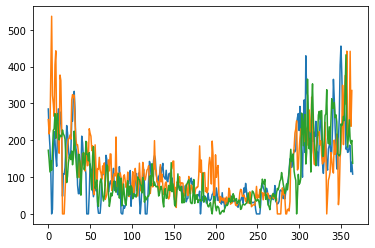

In [25]:
if __name__=='__main__':
    lst2013=avg_data_2013()
    lst2014=avg_data_2014()
    lst2015=avg_data_2015()
    lst2016=avg_data_2016()
    lst2017=avg_data_2017()
    lst2018=avg_data_2018()
    plt.plot(range(0,365),lst2013,label="2013 Data")
    plt.plot(range(0,364),lst2014,label="2014 Data")
    plt.plot(range(0,365),lst2015,label="2015 Data")
    plt.show()
#Day wise data of PM2.5, so in total 365 data points. Created lists of averages. 

In [5]:
lst2013[0:10]

[284.79583333333335,
 219.72083333333333,
 182.1875,
 115.28749999999998,
 0.0,
 12.379166666666668,
 154.03750000000002,
 223.20833333333334,
 200.64583333333337,
 154.875]

In [6]:
len(lst2013)

365

In [7]:
len(lst2014)

364

In [8]:
len(lst2015)

365

In [9]:
len(lst2016)

365

In [10]:
len(lst2017)

365

In [11]:
len(lst2018)

364

# Creating Packages of avg_data_(year) functions.

In [ ]:
!echo 'def hello():' > my_first_module.py
!echo '    print("Aresia is blonde")' >> my_first_module.py

In [ ]:
!cat my_first_module.py

In [ ]:
import my_first_module
my_first_module.hello()

In [11]:
!echo 'def avg_data_2013():' > data_2013_package.py 
!echo '   print(average)' >> data_2013_package.py 

!cat data_2013_package.py

# Application of Beautiful Soup for scraping.

Importing Libraries.

In [3]:
import requests
import sys
import pandas as pd
import os
from bs4 import BeautifulSoup
import csv
#from Air_Quality_Index_Live_Project import avg_data_2013,avg_data_2014,avg_data_2015,avg_data_2016,avg_data_2017,avg_data_2018

## Creation of final dataframe with dependent and independent features.



In [37]:
def met_data(month,year):
#open html files in read bytes mode.
    file_html = open('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Html_Data/{}/{}.html'.format(year,month),"rb")   
    
    #For Beautiful soup execution you have to implement a read function as shown below.
    plain_text=file_html.read()
    
    #Two new lists
    tempD=[]
    finalD=[]
    
    #Applying Beautiful soup. lxml tag is for scraping HTML fles. Hence we have provided the plain_text as input to bs4.
    soup=BeautifulSoup(plain_text,'lxml')
    
    #Find the class corresponding to the table cellpadding in the HTML page.
    for table in soup.findAll('table',{'class': 'medias mensuales numspan'}):
        for tbody in table:
            for tr in tbody:
                a=tr.get_text()
                tempD.append(a)
            
    rows=len(tempD)/15
    
    #Need to understand this code correctly..........................................
    
    for times in range(round(rows)):
        newtempD=[]
        for i in range(15):   #Because there are 15 features.
            newtempD.append(tempD[0])
            tempD.pop(0)    #Delete from tempD list
        finalD.append(newtempD)
    
    #dfD=pd.DataFrame(finalD,columns = ['Day','T', 'TM', 'Tm', 'SLP', 'H','PP', 'VV', 'V', 'VM','VG','RA','SN','TS','FG'])
     
    length = len(finalD)
    
    finalD.pop(length-1)  #Remove the second last entry in the list
    finalD.pop(0)  #Remove the zeroeth index of the list. This will remove the columns.
        
    for a in range(len(finalD)):
        finalD[a].pop(6)
        finalD[a].pop(13)
        finalD[a].pop(12)
        finalD[a].pop(11)
        finalD[a].pop(10)
        finalD[a].pop(9)
        finalD[a].pop(0)
        
    return finalD
        

Ideally tempD should look like ['Day',
 'T',
 'TM',
 'Tm',
 'SLP',
 'H',
 'PP',
 'VV',
 'V',
 'VM',
 'VG',
 'RA',
 'SN',
 'TS',
 'FG',
 '1',
 '25.6',
 '30.3',
 '20',
 '-',
 '71',
 '0',
 '2.4',
 '7.8',
 '18.3',
 '-',
 '\xa0',
 '\xa0',
 '\xa0',
 '\xa0',
 '2',
 '24.7',
 '30.6',
 '18',
 '-',
 '54',
 '0',
 '2.9',
 '9.8',
 '18.3']  Check the HTML table and re-verify.
 
 
 newtempD should look like 
 'Monthly means and totals:',
 '\xa0',
 '23.9',
 '30.6',
 '14.6',
 '-',
 '55.6',
 '0',
 '2.5',
 '7.4',
 '18.9',
 '\xa0',
 '0',
 '0',
 '0']
 
 finalD should look like [['Day',
  'T',
  'TM',
  'Tm',
  'SLP',
  'H',
  'PP',
  'VV',
  'V',
  'VM',
  'VG',
  'RA',
  'SN',
  'TS',
  'FG'],
 ['1',
  '25.6',
  '30.3',
  '20',
  '-',
  '71',
  '0',
  '2.4',
  '7.8',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['2',
  '24.7',
  '30.6',
  '18',
  '-',
  '54',
  '0',
  '2.9',
  '9.8',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['3',
  '23.3',
  '29.3',
  '15.2',
  '-',
  '50',
  '0',
  '2.7',
  '7',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['4', '', '', '', '', '', '', '', '', '', '', '\xa0', '\xa0', '\xa0', '\xa0'],
 ['5', '', '', '', '', '', '', '', '', '', '', '\xa0', '\xa0', '\xa0', '\xa0'],
 ['6', '', '', '', '', '', '', '', '', '', '', '\xa0', '\xa0', '\xa0', '\xa0'],
 ['7',
  '21.8',
  '29.5',
  '11.3',
  '-',
  '52',
  '0',
  '2.7',
  '7.2',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['8',
  '24.3',
  '32.8',
  '14.5',
  '-',
  '46',
  '0',
  '2.4',
  '7.6',
  '16.5',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['9',
  '25.9',
  '34',
  '15.8',
  '-',
  '50',
  '0',
  '2.4',
  '6.7',
  '16.5',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['10',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['11',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['12',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['13',
  '25.3',
  '33.5',
  '14.4',
  '-',
  '43',
  '0',
  '2.6',
  '5.4',
  '16.5',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['14',
  '25.7',
  '32.6',
  '15.2',
  '-',
  '56',
  '0',
  '2.4',
  '7.6',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['15',
  '24.7',
  '31.5',
  '14',
  '-',
  '60',
  '0',
  '2.3',
  '5',
  '18.3',
  '-',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],
 ['16',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '\xa0',
  '\xa0',
  '\xa0',
  '\xa0'],

In [38]:
def data_combine(year, cs):
    for a in pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data/real_' + str(year) + '.csv', chunksize=cs):
        df = pd.DataFrame(data=a)
        mylist = df.values.tolist()
    return mylist

In [40]:
if __name__=="__main__":
    if not os.path.exists('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data'):
        os.makedirs('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data')
    for year in range(2013,2019):
        final_data=[]
        with open('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data/real_' + str(year) + '.csv','w') as csvfile:
            wr = csv.writer(csvfile,dialect='excel')
            wr.writerow([ 'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM','PM2.5'])  # Since the cols from the list were deleted.
            
        #Call the above met_data function for geting the independent features.
        for month in range(1,13):
            temp = met_data(month,year)
            final_data = final_data + temp
            #print('final_data1', final_data)
            
        dfD=pd.DataFrame(final_data,columns = ['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM'])   
        #Get the dependent feature. So calling all the avg_data_year functions from this for loop using getattr function.
        
        if year == 2013:
            pm = avg_data_2013()
            print('pm in 2013')
        elif year == 2014:
            pm = avg_data_2014()
            print('pm in 2014')
        elif year == 2015:
            pm = avg_data_2015()
            print('pm in 2015')
        elif year == 2016:
            pm = avg_data_2016()
            print('pm in 2016')
        elif year == 2017:
            pm = avg_data_2017()
            print('pm in 2017')
        elif year == 2018:
            pm = avg_data_2018()
            print('pm in 2018')
        #pm = getattr(sys.modules[__name__], 'avg_data_{}.format(year)')()
        #pm = avg_data_{}().format(year)
            
        if len(pm)==364:
            pm.insert(364, '_')
            
        #Insert the dependent value in the 8th col. Here -1 is done because list index starts from 0.
            
        for i in range(len(final_data)-1):
            final_data[i].insert(8, pm[i])
            #print('final_data2', final_data)
            
        #Create csv files for the final output. 'a' is for append data.
        with open('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data/real_' + str(year) + '.csv','a') as csvfile:
            wr1 = csv.writer(csvfile, dialect='excel')
            for row in final_data:
                flag = 0
                for elem in row:
                    if elem == " " or elem == "-":
                        flag=1
                if flag!=1:
                    wr1.writerow(row)
                            
            
    data_2013 = data_combine(2013, 600)
    data_2014 = data_combine(2014, 600)
    data_2015 = data_combine(2015, 600)
    data_2016 = data_combine(2016, 600)
    data_2017 = data_combine(2017, 600)
    data_2018 = data_combine(2018, 600)
            
    total = data_2013 + data_2014 + data_2015 + data_2016 + data_2017 + data_2018 
        
    # Final combined data in csv
    with open('/Users/sunandakumarghosh/Desktop/My Analytics Project/Kaggle/Air Quality Index- Live Project/Data/Real_Data/Real_Combine.csv', 'w') as csvfile:
        wr = csv.writer(csvfile,dialect='excel')
        wr.writerow([ 'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM','PM2.5'])
        wr.writerows(total)
            
        

pm in 2013
pm in 2014
pm in 2015
pm in 2016
pm in 2017
pm in 2018


In [43]:
dfD.head(n=15)

,T,TM,Tm,SLP,H,VV,V,VM
0,25.1,31,15.5,-,49,2.6,6.5,20.6
1,24,28,14.1,-,56,2.3,6.3,18.3
2,24.8,30,16.4,-,66,1.9,6.5,18.3
3,,,,,,,,
4,,,,,,,,
5,,,,,,,,
6,23.3,28,13.8,-,45,3.5,8.5,18.3
7,23.7,28,13.6,-,58,2.7,7.2,18.3
8,25.4,32,16.6,-,56,2.1,6.3,16.5
9,,,,,,,,


In [ ]:
final_data

===================================================================================================================================================================

# Apply ML Models

1. Linear Regression
2. Lasso Regression
3. Decision Tree Regressor
4. KNN Regressor
5. Random ForestRegressor
6. Xgboost Regressor
7. Hyperparameter Tuning
8. ANN - Artificial Neural Network.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sc

In [2]:
df= pd.read_csv('/Users/sunandakumarghosh/Desktop/My Analytics Repository/Projects/Air Quality Index- Live Project/Real_Combine.csv')

In [3]:
df.isnull().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

In [4]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


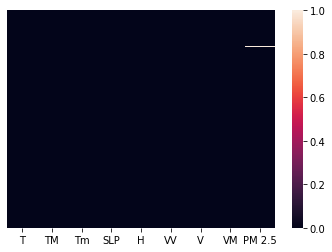

In [5]:
sns.heatmap(df.isnull(),yticklabels=False, cbar=True)

In [6]:
#Drops the entire row which has null values.
df=df.dropna()

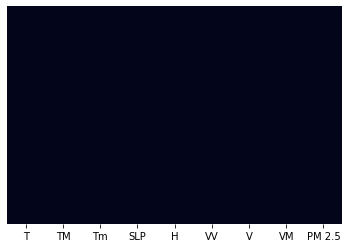

In [7]:
sns.heatmap(df.isnull(),yticklabels=False, cbar=False)

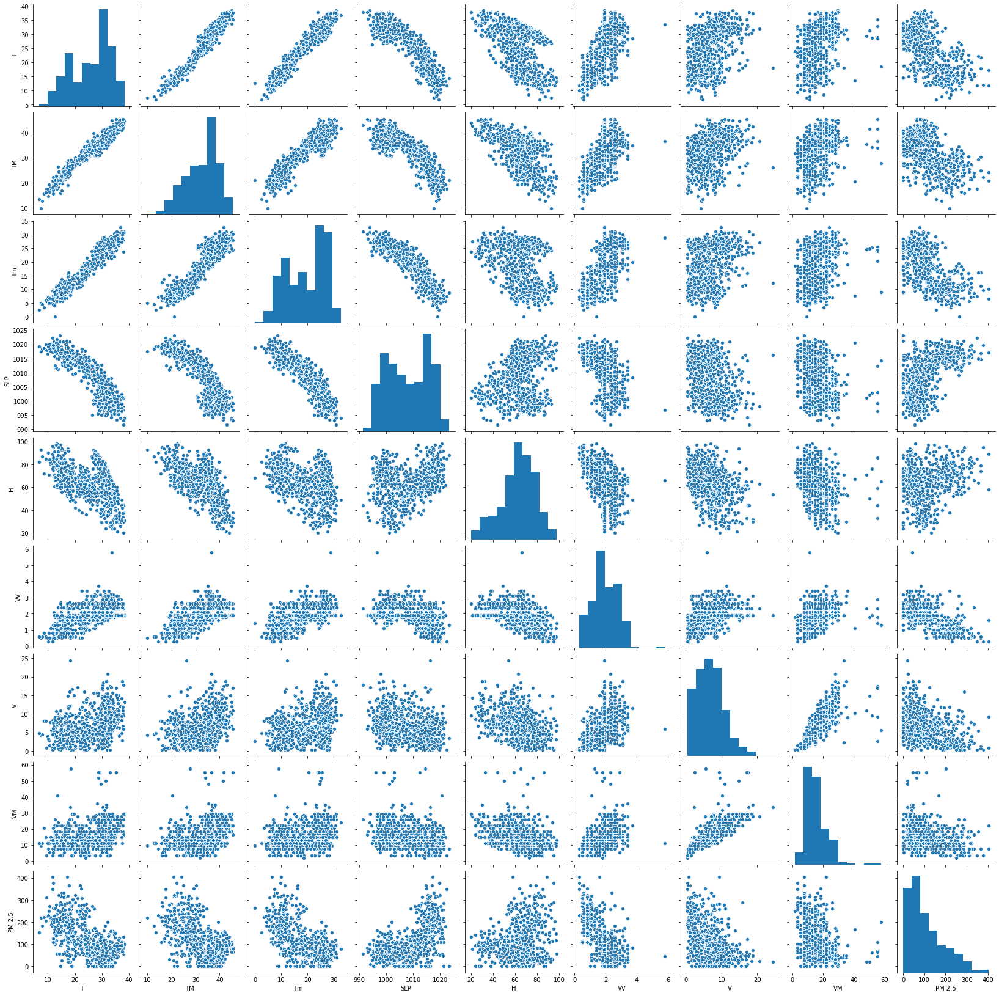

In [8]:
sns.pairplot(data=df)

Here PM2.5 variable doesnt have any linear relation ship with any of its independent features as shown above. Hence linear regression might not be a good model for this scenario.

In [9]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


In [10]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


# Correlation Matrix with HeatMap

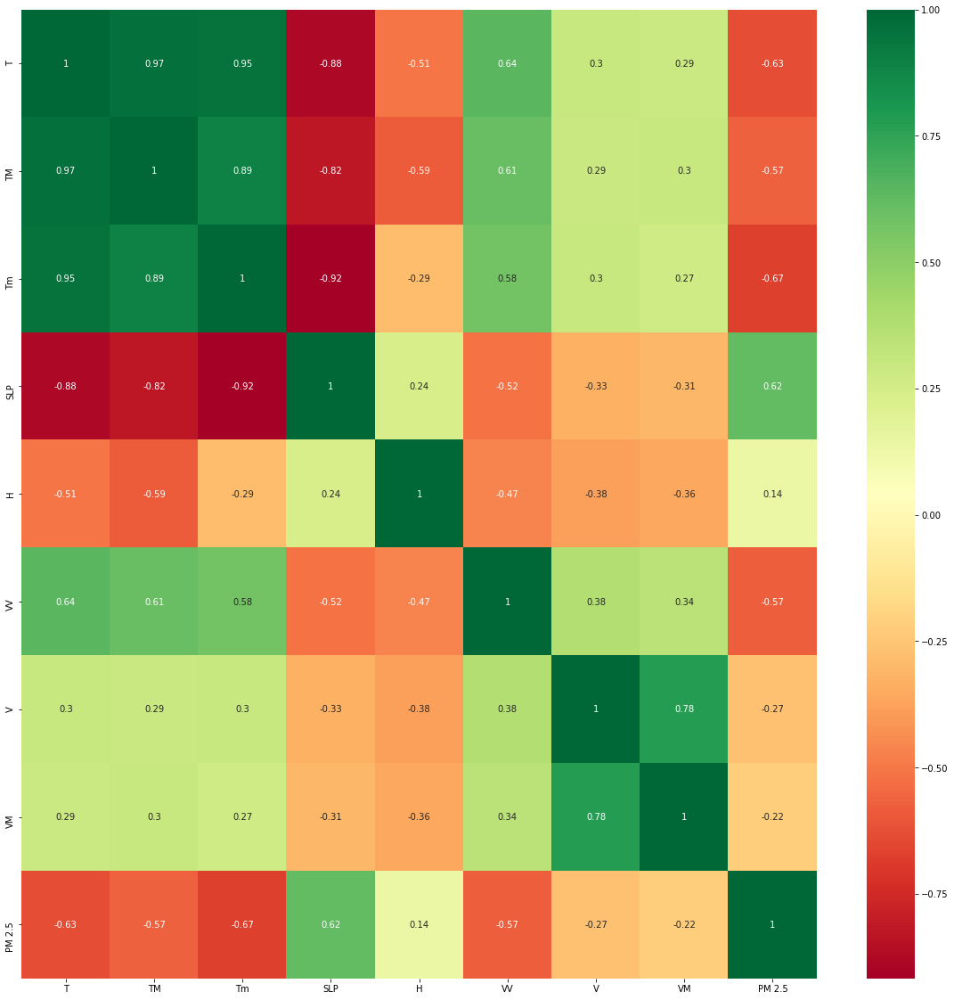

In [11]:
corrmat=df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap='RdYlGn')

# Lets check the new Predictive Power Score (PPS).

In [12]:
import ppscore as pps

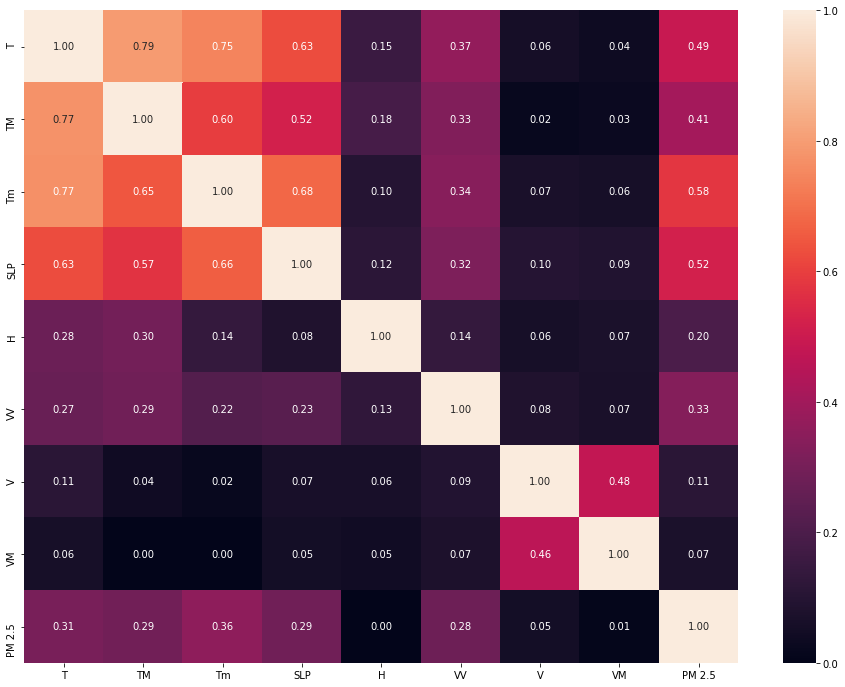

In [13]:
plt.figure(figsize=(16,12))
plt.xlabel('Features')
plt.ylabel('Target')
sns.heatmap(pps.matrix(df),annot=True,fmt=".2f")
plt.show()

In [14]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


## Calculation of the PPS

There are multiple ways how you can calculate the PPS. The ppscore package provides a sample implementation that is based on the following calculations:

1. The score is calculated using only 1 feature trying to predict the target column. This means there are no interaction effects between the scores of various features. Note that this is in contrast to feature importance.

2. The score is calculated on the test sets of a 4-fold crossvalidation (number is adjustable via ppscore.CV_ITERATIONS)

3. All rows which have a missing value in the feature or the target column are dropped.

4. In case that the dataset has more than 5,000 rows the score is only calculated on a random subset of 5,000 rows with a fixed random seed (ppscore.RANDOM_SEED). You can adjust the number of rows or skip this sampling via the API. However, in most scenarios the results will be very similar.

5. There is no grid search for optimal model parameters.

## Learning algorithm

As a learning algorithm, we currently use a Decision Tree because the Decision Tree has the following properties:

1. can detect any non-linear bivariate relationship

2. good predictive power in a wide variety of use cases.

3. low requirements for feature preprocessing.

4. robust model which can handle outliers and does not easily overfit.

5. can be used for classification and regression
6. can be calculated quicker than many other algorithms

We differentiate the exact implementation based on the data type of the target column:

1. If the target column is numeric, we use the sklearn.DecisionTreeRegressor.
2. If the target column is categoric, we use the sklearn.DecisionTreeClassifier.

Please note that we prefer a general good performance on a wide variety of use cases over better performance in some narrow use cases. 

However, please note why we actively decided against the following algorithms:

1. Correlation or Linear Regression: cannot detect non-linear bivariate relationships without extensive preprocessing
2. GAMs: might have problems with very unsmooth functions
3. SVM: potentially bad performance if the wrong kernel is selected
4. Random Forest/Gradient Boosted Tree: slower than a single Decision Tree
5. Neural Networks and Deep Learning: slower calculation than a Decision Tree and also needs more feature preprocessing

## Data preprocessing

Even though the Decision Tree is a very flexible learning algorithm, we need to perform the following preprocessing steps if a column has the pandas dtype object.‌

1. If the target column is categoric, we use the sklearn.LabelEncoder​
2. If the feature column is categoric, we use the sklearn.OneHotEncoder​

## Inference of the prediction task
The choice of the task (classification or regression) has an influence on the final PPS and thus it is important how the task is chosen. If you calculate a single score, you can pass in a specific task. If you do not specify the task, the task is inferred as follows.

A classification is inferred if one of the following conditions meet:

1. the target has the dtype object or categorical
2. the target only has two unique values
3. the target is numeric but has less than 15 unique values. This breakpoint can be overridden via the constant ppscore.NUMERIC_AS_CATEGORIC_BREAKPOINT

Otherwise, the task is inferred as regression if the dtype is numeric (float or integer).

## Tasks and their score metrics​

Based on the data type and cardinality of the target column, ppscore assumes either the task of a classification or regression. Each task uses a different evaluation score for calculating the final predictive power score (PPS).

## Regression.

In case of an regression, the ppscore uses the mean absolute error (MAE) as the underlying evaluation metric (MAE_model). The best possible score of the MAE is 0 and higher is worse. As a baseline score, we calculate the MAE of a naive model (MAE_naive) that always predicts the median of the target column. The PPS is the result of the following normalization (and never smaller than 0):

PPS = 1 - (MAE_model / MAE_naive)

## Classification

If the task is a classification, we compute the weighted F1 score (wF1) as the underlying evaluation metric (F1_model). The F1 score can be interpreted as a weighted average of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0. The relative contribution of precision and recall to the F1 score are equal. The weighted F1 takes into account the precision and recall of all classes weighted by their support as described here. As a baseline score, we calculate the weighted F1 score of a naive model (F1_naive) that always predicts the most common class of the target column. The PPS is the result of the following normalization (and never smaller than 0):

PPS = (F1_model - F1_naive) / (1 - F1_naive

# Gaussian Distribution
## Q-Q Plot

In [15]:
def diagnostic_plots(df, variable):
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    df[variable].hist()
    
    plt.subplot(1,2,2)
    sc.stats.probplot(df[variable], dist='norm', plot=plt)
    
    plt.show()

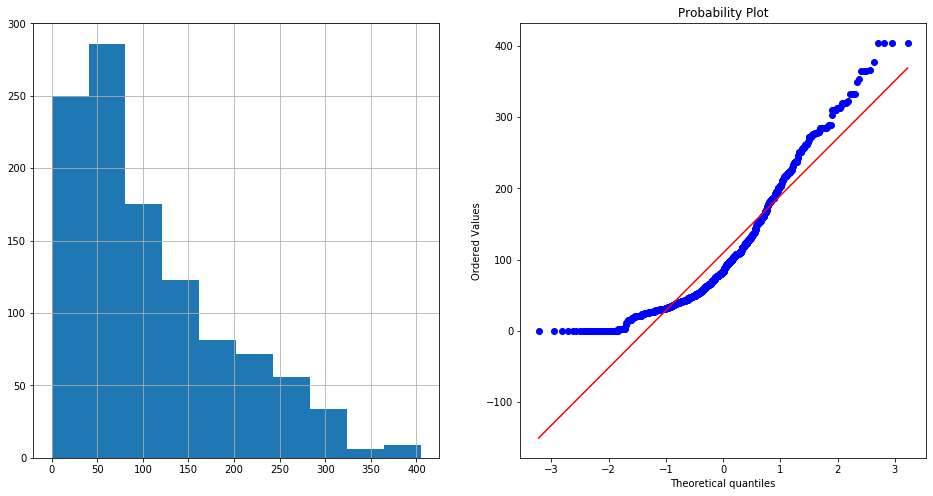

In [16]:
diagnostic_plots(df, 'PM 2.5')

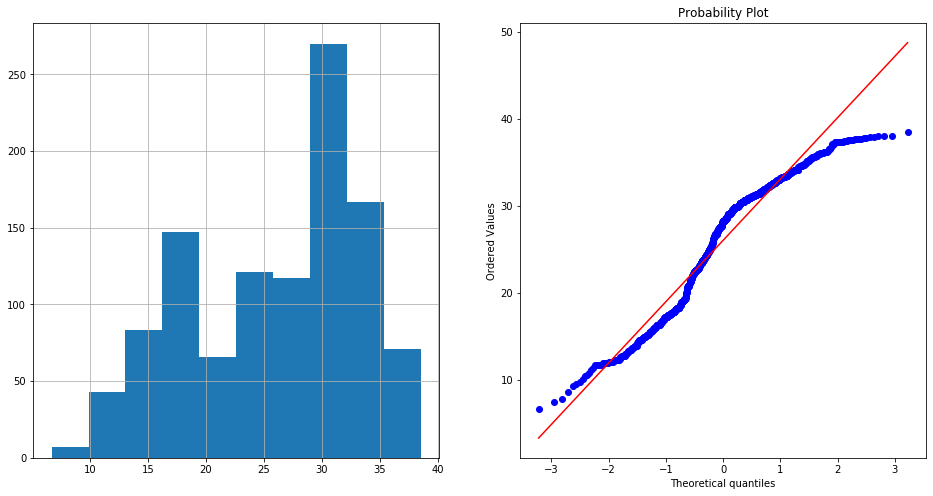

In [17]:
diagnostic_plots(df, 'T')

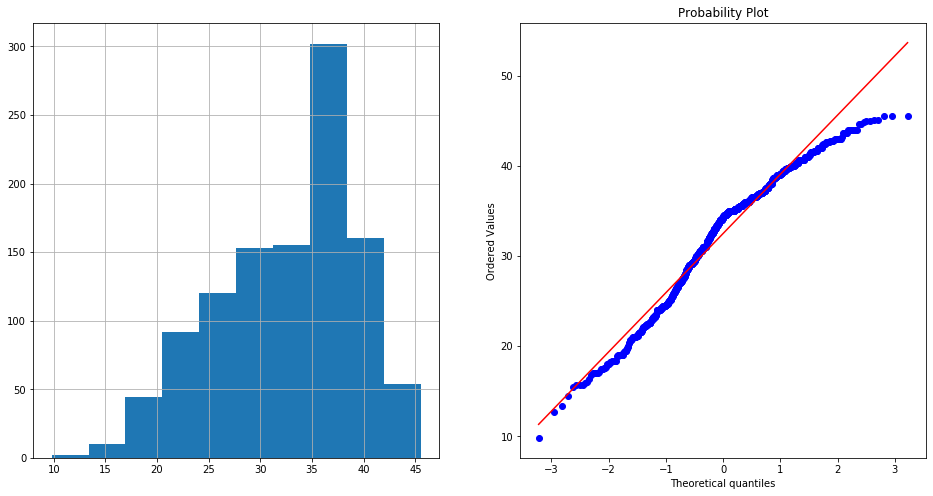

In [18]:
diagnostic_plots(df, 'TM')

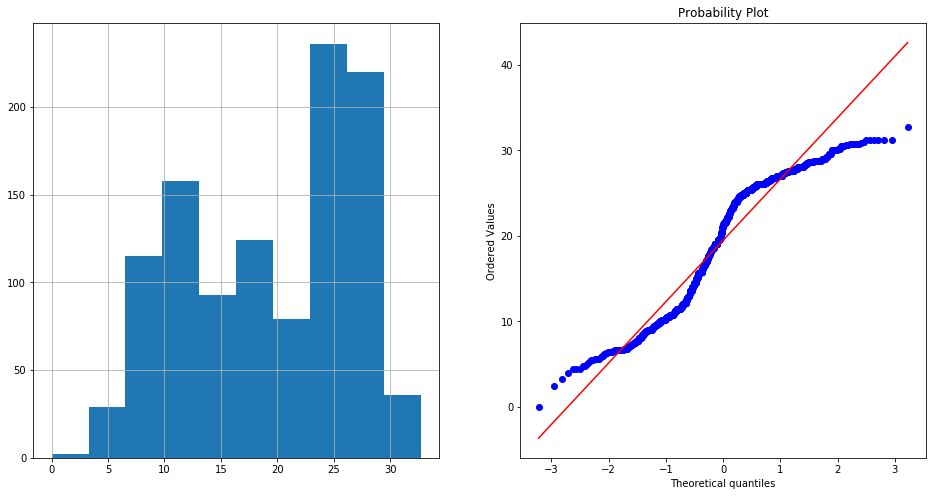

In [19]:
diagnostic_plots(df, 'Tm')

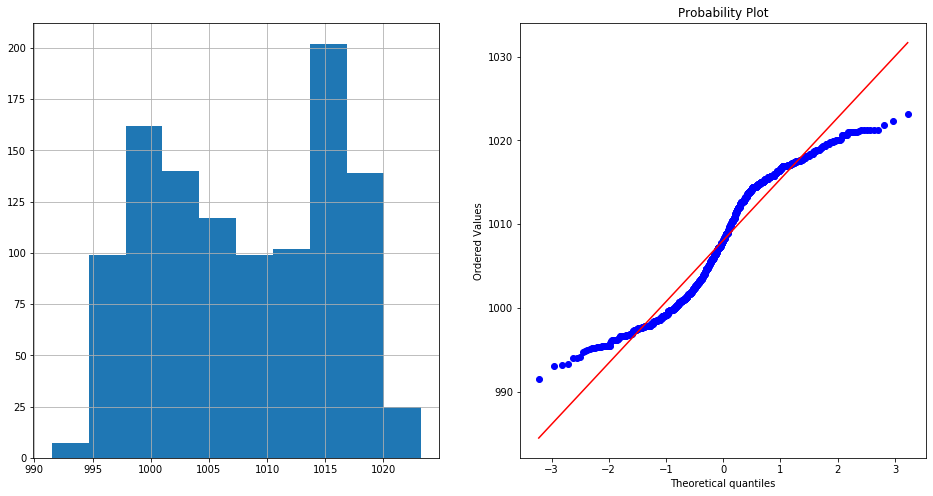

In [20]:
diagnostic_plots(df, 'SLP')

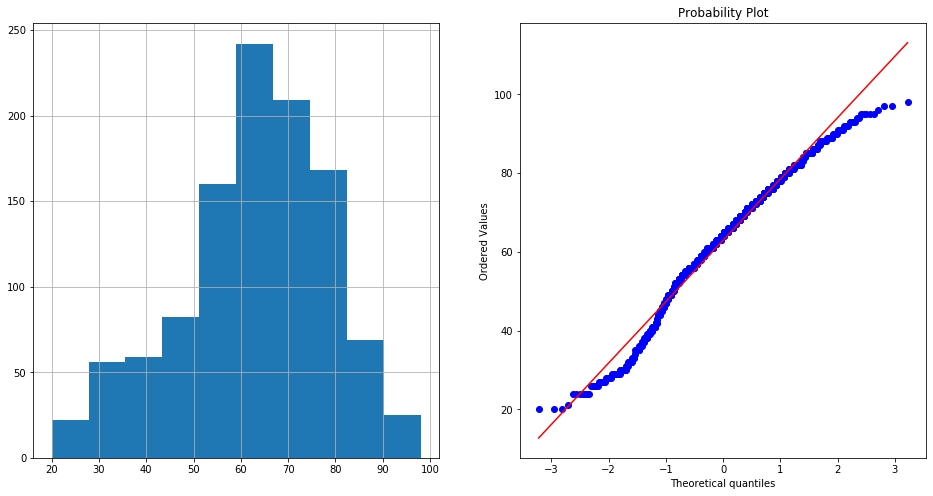

In [21]:
diagnostic_plots(df, 'H')

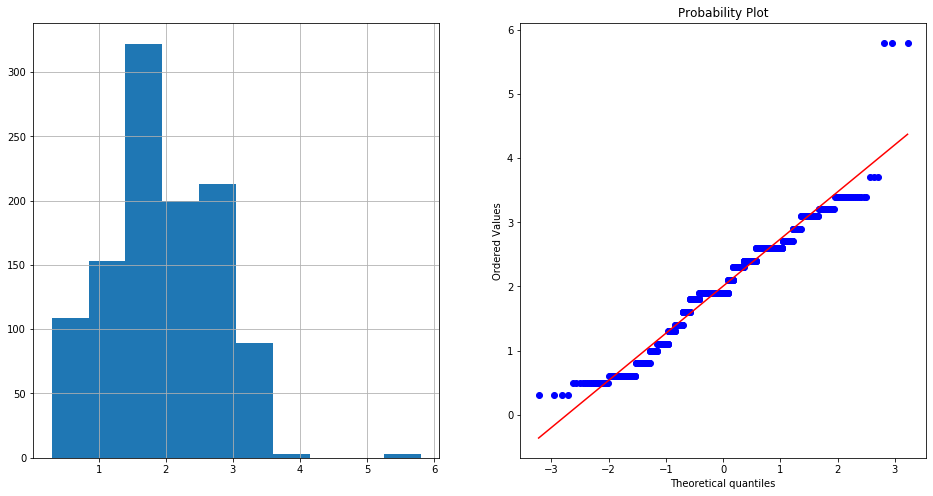

In [22]:
diagnostic_plots(df, 'VV')

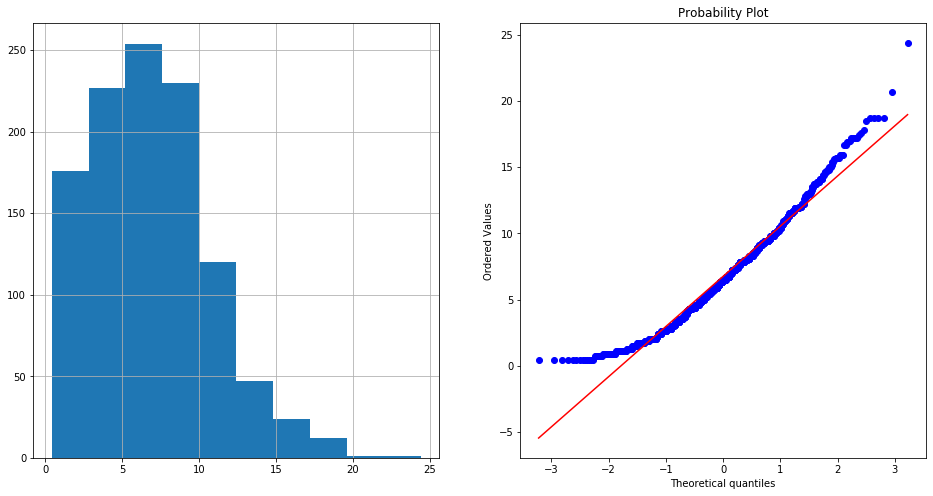

In [23]:
diagnostic_plots(df, 'V')

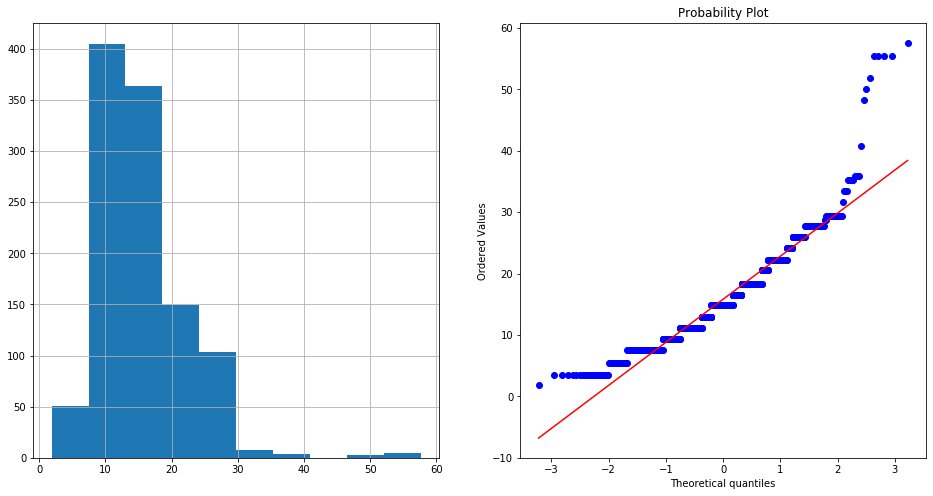

In [24]:
diagnostic_plots(df, 'VM')

# Logarithmic transformation of PM 2.5

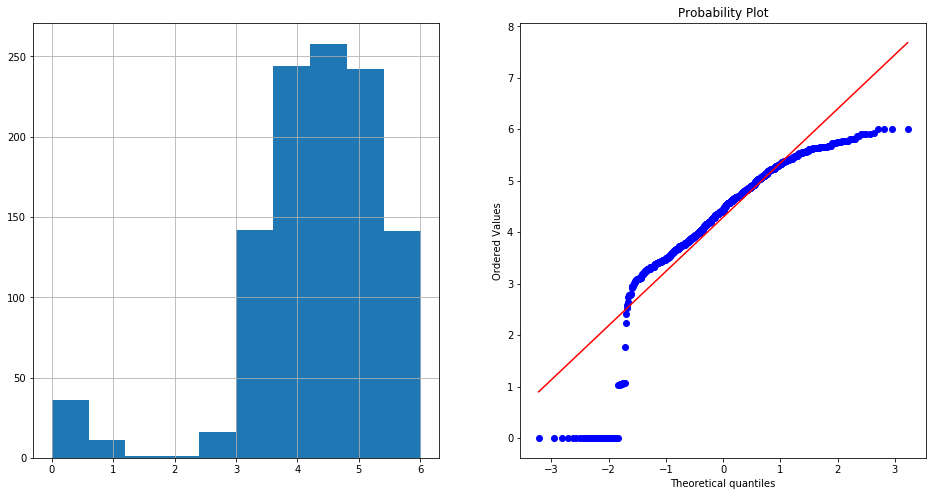

In [25]:
#Here +1 is to avoid any situation where Fare = 0 so that Log(0) doesnt happen
df['Log_PM2.5'] = np.log(df['PM 2.5']+1)
diagnostic_plots(df, 'Log_PM2.5')

# Feature Importance - Extra Tree Regressor (Solves the outlier problem)

You can get the feature importance of each feature of your dataset by using thefeature importance property of the model.

Feature importance gives you a score for each feature of your data , the higher te score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top10 features of the dataset.

In [26]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5,Log_PM2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833,5.396899
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500,5.210510
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500,5.043667
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333,5.412576
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833,5.306513


In [27]:
X=df.iloc[:,:8]

In [28]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [29]:
Y=df['PM 2.5']

In [30]:
Y

0       219.720833
1       182.187500
2       154.037500
3       223.208333
4       200.645833
           ...    
1088    288.416667
1089    256.833333
1090    169.000000
1091    186.041667
1092    185.583333
Name: PM 2.5, Length: 1092, dtype: float64

## To be used only when we have a lot of features.

In [31]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(X,Y)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [32]:
print(model.feature_importances_)

[0.18855511 0.12246207 0.19232217 0.13878299 0.08540292 0.17492905
 0.0534142  0.04413149]


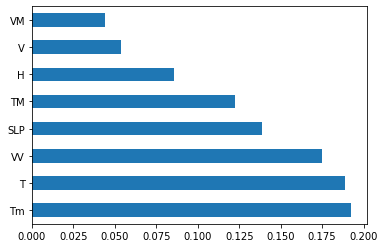

In [33]:
#Plot graph of feature importances
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

## T feature is most important here. But how? T has the highest Standard Error amongst the independent features and also the p-value is > 0.05. There must be something with the Extra Tree Regressor. Need to check.

# Linear Regression.

In [34]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

In [35]:
from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

## R-squared value on train set

In [36]:
print("Coefficient of Determination R-Squared on train set: {}".format(regressor.score(X_train,Y_train)))

Coefficient of Determination R-Squared on train set: 0.551516808175875


## R-squared value on test set

In [37]:
print("Coefficient of Determination R-Squared on train set: {}".format(regressor.score(X_test,Y_test)))

Coefficient of Determination R-Squared on train set: 0.48525331308567876


## Lets check the model summary

In [38]:
X1_train = X_train.copy()

In [39]:
Y1_train = Y_train.copy()

In [40]:
import statsmodels.api as sm
X1_train = sm.add_constant(X1_train)
X1_train.head()

/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,const,T,TM,Tm,SLP,H,VV,V,VM
1068,1.0,21.7,30.0,12.2,1014.5,52.0,1.1,6.3,16.5
181,1.0,13.6,20.4,7.5,1020.7,67.0,1.1,10.2,40.7
426,1.0,31.8,39.6,25.4,1005.6,35.0,1.9,11.1,27.8
1019,1.0,28.3,35.8,26.8,1003.9,89.0,1.6,4.3,11.1
9,1.0,11.9,18.9,6.3,1020.1,76.0,1.1,8.3,20.6


In [41]:
results = sm.OLS(Y1_train,X1_train).fit()
results.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PM 2.5   R-squared:                       0.552
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     116.1
Date:                Thu, 11 Jun 2020   Prob (F-statistic):          5.26e-126
Time:                        01:27:33   Log-Likelihood:                -4164.8
No. Observations:                 764   AIC:                             8348.
Df Residuals:                     755   BIC:                             8389.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        448.1162    784.795      0.571      0.568   -1092.523    1988.756
T             -2.6909      2.360     -1.140      0.255      -7.324       1.942
TM             0.4622      1.416      0.326      0.744      -2.317       3.242
Tm            -3.8671      1.585     -2.439      0.015      -6.979      -0.755
SLP           -0.0449      0.753     -0.060      0.952      -1.522       1.433
H             -1.2119      0.296     -4.100      0.000      -1.792      -0.632
VV           -40.1149      3.986    -10.065      0.000     -47.939     -32.290
V             -2.5356      0.973     -2.607      0.009      -4.445      -0.626
VM             0.5615      0.471      1.191      0.234      -0.364       1.487
==============================================================================
Omnibus:                       60.272   Durbin-Watson:                   1.940
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              100.503
Skew:                           0.554   Prob(JB):                     1.50e-22
Kurtosis:                       4.389   Cond. No.                     3.87e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.87e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Cross Validation

In [42]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(regressor,X,Y,cv=5)

In [43]:
score

array([0.51616617, 0.43816894, 0.50733957, 0.4861091 , 0.40750087])

In [44]:
score.mean()

0.47105693048073916

# Model Evaluation.

In [45]:
regressor.coef_

array([ -2.69090829,   0.46219975,  -3.86705184,  -0.04494855,
        -1.21193616, -40.11490762,  -2.53563257,   0.56148181])

In [46]:
regressor.intercept_

448.1161696758816

In [47]:
coeff_df = pd.DataFrame(regressor.coef_,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
T,-2.690908
TM,0.462200
Tm,-3.867052
SLP,-0.044949
H,-1.211936
VV,-40.114908
V,-2.535633
VM,0.561482


## Predict for X_test

In [48]:
prediction=regressor.predict(X_test)

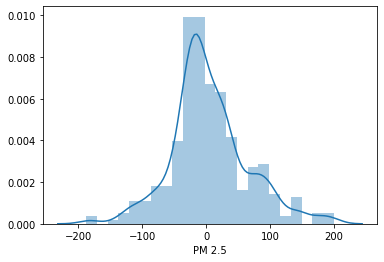

In [49]:
sns.distplot(Y_test-prediction)

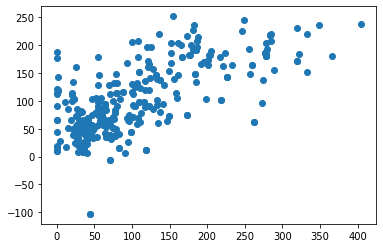

In [50]:
plt.scatter(Y_test,prediction)

# Regression Evaluation Metrics


Here are three common evaluation metrics for regression problems:

**Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.
- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

In [51]:
from sklearn import metrics

In [52]:
print("Mean Absolute Error (MAE) : ", metrics.mean_absolute_error(Y_test, prediction))

Mean Absolute Error (MAE) :  44.83624126628639


In [53]:
print("Mean Squared Error (MSE) : ", metrics.mean_squared_error(Y_test, prediction))

Mean Squared Error (MSE) :  3687.5430309324192


In [54]:
print("Root Mean Squared Error (RMSE) : ", np.sqrt(metrics.mean_squared_error(Y_test, prediction)))

Root Mean Squared Error (RMSE) :  60.725143317512384


## Using Mean Squared Error for cross val score (Cross Validations) in Linear Regression. Will require this in Ridge and Lasso Regression.

In [55]:
mse=cross_val_score(regressor,X,Y,scoring='neg_mean_squared_error',cv=5)
mse

array([-3578.63747158, -2495.13524377, -3335.35121512, -3704.64559628,
       -5317.23935995])

In [56]:
mean_mse=np.mean(mse)
mean_mse  

-3686.201777339885

## This value should be as less as possible. That is nearer to Zero.

# Pickling - Linear Regression

In [57]:
# open a file, where you ant to store the data
file = open('regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(regressor, file)

<IPython.core.display.Javascript object>

===================================================================================================================================================================

# Ridge and Lasso Regression - Hyperparameter Tuning in case of Linear Regression. Checking models thru MSE.

## Ridge Regression.

In [58]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV # Will be used for Cross Validation in Ridge, i.e. find the lambda value.

In [59]:
ridge=Ridge()
parameters={'alpha' :[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]}
ridge_reg=GridSearchCV(ridge,parameters,scoring='neg_mean_squared_error',cv=5)  #5 cross validations, find the best Lambda.
ridge_reg.fit(X,Y)

GridSearchCV(cv=5, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75,
                                   80, 85, 90, 95, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [60]:
print(ridge_reg.best_params_) #lambda/alpha value
print(ridge_reg.best_score_)  #mse

{'alpha': 70}
-3660.877838609663


## -3660.877838609663 MSE of Ridge is better than -3686.201777339885 of Linear Regression.

## Lasso Regression.

In [61]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso

lasso=Lasso()
parameters={'alpha' :[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,15,20,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]} #Dictionary used here, Key-Value Pairs.
lasso_reg=GridSearchCV(lasso,parameters,scoring='neg_mean_squared_error',cv=5)  #5 cross validations, find the best Lambda.
lasso_reg.fit(X,Y)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1444245.8932926375, tolerance: 614.5592033746459
  positive)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1568739.7853185309, tolerance: 678.9710639134809
  positive)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1456481.2303352042, tolerance: 626.8737580831347
  positive)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Dualit

GridSearchCV(cv=5, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   15, 20, 30, 35, 40, 45, 50, 55, 60, 65, 70,
                                   75, 80, 85, 90, 95, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [62]:
print(lasso_reg.best_params_) #lambda/alpha value
print(lasso_reg.best_score_)  #mse

{'alpha': 1}
-3666.783253437021


## Model Evaluation - Ridge Regressor

In [63]:
prediction_Ridge = ridge_reg.predict(X_test)

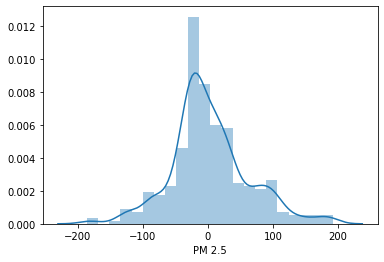

In [64]:
sns.distplot(Y_test-prediction_Ridge)

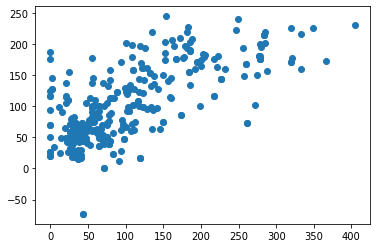

In [65]:
plt.scatter(Y_test,prediction_Ridge)

In [66]:
print("Mean Absolute Error (MAE) for Ridge : ", metrics.mean_absolute_error(Y_test, prediction_Ridge))
print("Mean Squared Error (MSE) for Ridge : ", metrics.mean_squared_error(Y_test, prediction_Ridge))
print("Root Mean Squared Error (RMSE) for Ridge : ", np.sqrt(metrics.mean_squared_error(Y_test, prediction_Ridge)))

Mean Absolute Error (MAE) for Ridge :  44.720387416435905
Mean Squared Error (MSE) for Ridge :  3631.700009924391
Root Mean Squared Error (RMSE) for Ridge :  60.26358776180183


In [67]:
## Model Evaluation - Lasso Regressor

In [68]:
prediction_Lasso = lasso_reg.predict(X_test)

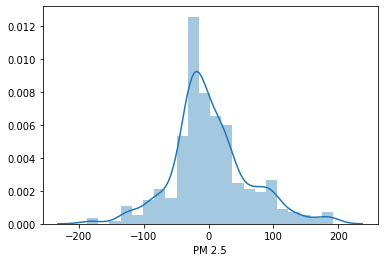

In [69]:
sns.distplot(Y_test-prediction_Lasso)

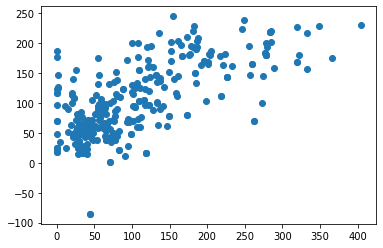

In [70]:
plt.scatter(Y_test,prediction_Lasso)

In [71]:
print("Mean Absolute Error (MAE) for Lasso : ", metrics.mean_absolute_error(Y_test, prediction_Lasso))
print("Mean Squared Error (MSE) for Lasso : ", metrics.mean_squared_error(Y_test, prediction_Lasso))
print("Root Mean Squared Error (RMSE) for Lasso : ", np.sqrt(metrics.mean_squared_error(Y_test, prediction_Lasso)))

Mean Absolute Error (MAE) for Lasso :  44.50831198875126
Mean Squared Error (MSE) for Lasso :  3627.8109390424697
Root Mean Squared Error (RMSE) for Lasso :  60.2313119485411


## All the MAE, MSE and RMSE are smaller in case of Lasso Regression. Hence its the better model here.

# Pickling - Lasso Regression

In [72]:
# open a file, where you want to store the data
file = open('Lasso_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(lasso_reg, file)

<IPython.core.display.Javascript object>

===================================================================================================================================================================

# Decision Tree Regressor.

In [73]:
from sklearn.tree import DecisionTreeRegressor

In [74]:
#Here only the criterion parameter is used. Other parms are not used now, so we will see an overfitting now.
dtree = DecisionTreeRegressor(criterion='mse') 

In [75]:
dtree.fit(X_train, Y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

## Now lets see what over-fitting looks like. R-squared value on the training set.

In [76]:
print("Coefficient of Determination R-Squared on train set using decision tree regressor: {}".format(dtree.score(X_train,Y_train)))

Coefficient of Determination R-Squared on train set using decision tree regressor: 1.0


Without the other parameters in Decision tree, the Dtree will split the data till the last leaf node. Hence the overfitting.

In [77]:
print("Coefficient of Determination R-Squared on test set using decision tree regressor: {}".format(dtree.score(X_test,Y_test)))

Coefficient of Determination R-Squared on test set using decision tree regressor: 0.6855955544656643


# Tree Visualization-1

Scikit Learn actually has some built-in visualization capabilitiesfor Decision Trees.

In [78]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz  #Takes only list as input
import pydotplus

/opt/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [79]:
features= list(X.columns)

In [80]:
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

## Tree Visualization

In [81]:
dot_data = StringIO()  # output console
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Tree Visualization -2

In [82]:
from sklearn import tree

In [83]:
dtr=tree.DecisionTreeRegressor(random_state=0)

In [84]:
dtr = dtr.fit(X,Y)

[Text(325.6476350041746, 532.275, 'X[0] <= 24.25\nmse = 7127.936\nsamples = 1092\nvalue = 109.091'),
 Text(151.65189646946564, 509.625, 'X[5] <= 1.2\nmse = 6660.631\nsamples = 419\nvalue = 181.469'),
 Text(60.88150047709923, 486.975, 'X[6] <= 0.8\nmse = 4852.254\nsamples = 181\nvalue = 222.396'),
 Text(25.73473282442748, 464.32500000000005, 'X[3] <= 1016.95\nmse = 4358.309\nsamples = 10\nvalue = 305.078'),
 Text(22.89503816793893, 441.675, 'X[0] <= 15.0\nmse = 1597.08\nsamples = 5\nvalue = 245.74'),
 Text(20.623282442748092, 419.025, 'X[1] <= 19.25\nmse = 33.11\nsamples = 2\nvalue = 282.662'),
 Text(19.48740458015267, 396.375, 'mse = 0.0\nsamples = 1\nvalue = 288.417'),
 Text(21.75916030534351, 396.375, 'mse = 0.0\nsamples = 1\nvalue = 276.908'),
 Text(25.16679389312977, 419.025, 'X[5] <= 1.05\nmse = 1124.98\nsamples = 3\nvalue = 221.125'),
 Text(24.03091603053435, 396.375, 'X[6] <= 0.55\nmse = 27.782\nsamples = 2\nvalue = 197.604'),
 Text(22.89503816793893, 373.725, 'mse = 0.0\nsample

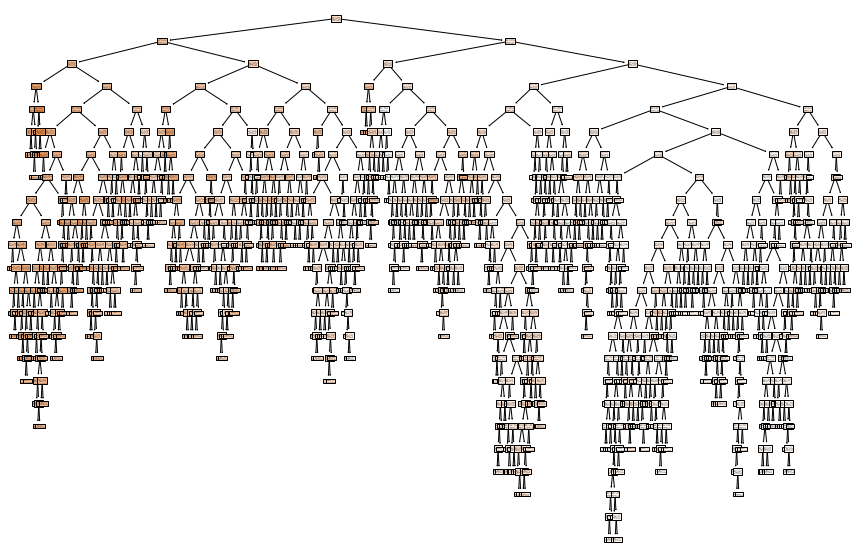

In [85]:
plt.figure(figsize=(15,10))
tree.plot_tree(dtr,filled=True)

In [86]:
print(tree.export_text(dtr))

|--- feature_0 <= 24.25
|   |--- feature_5 <= 1.20
|   |   |--- feature_6 <= 0.80
|   |   |   |--- feature_3 <= 1016.95
|   |   |   |   |--- feature_0 <= 15.00
|   |   |   |   |   |--- feature_1 <= 19.25
|   |   |   |   |   |   |--- value: [288.42]
|   |   |   |   |   |--- feature_1 >  19.25
|   |   |   |   |   |   |--- value: [276.91]
|   |   |   |   |--- feature_0 >  15.00
|   |   |   |   |   |--- feature_5 <= 1.05
|   |   |   |   |   |   |--- feature_6 <= 0.55
|   |   |   |   |   |   |   |--- value: [192.33]
|   |   |   |   |   |   |--- feature_6 >  0.55
|   |   |   |   |   |   |   |--- value: [202.88]
|   |   |   |   |   |--- feature_5 >  1.05
|   |   |   |   |   |   |--- value: [268.17]
|   |   |   |--- feature_3 >  1016.95
|   |   |   |   |--- feature_2 <= 8.50
|   |   |   |   |   |--- value: [349.29]
|   |   |   |   |--- feature_2 >  8.50
|   |   |   |   |   |--- feature_6 <= 0.55
|   |   |   |   |   |   |--- value: [376.92]
|   |   |   |   |   |--- feature_6 >  0.55
|   |   |  

# Decision Tree Model Evaluation

In [87]:
prediction_dtree = dtree.predict(X_test)

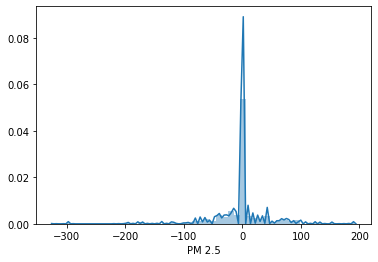

In [88]:
sns.distplot(Y_test-prediction_dtree)

## Huge Over-fitting

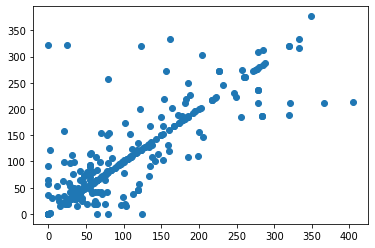

In [89]:
plt.scatter(Y_test,prediction_dtree)

# HyperParameter Tuning for Decision Tree Regressor - Pruning Decision Trees.

In [90]:
#Hyperparameter optimization using GridSearchCV.
from sklearn.model_selection import GridSearchCV

In [91]:
# Hyper Parameter Optimization. Params here are provided as key-value pairs.
params={
    "splitter"                :["best","random"],
    "max_depth"               :[3,4,5,6,7,8,9,10,11,12,13,14,15],
    "min_samples_leaf"        :[1,2,3,4,5,6],
    "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
    "max_features"            :['auto','log2','sqrt',None],
    "max_leaf_nodes"          :[None,10,20,30,40,50,60,70,80]
    
}

In [92]:
dtree_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=5,verbose=3)

# To Calculate the time.

In [93]:
def timer(Start_time=None):
    if not Start_time:
        Start_time=datetime.now()
        return Start_time
    elif Start_time:
        thour, temp_sec = divmod((datetime.now()-Start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec,60)
        print('\n Time taken: {} hours {} minutes {} seconds'.format(thour,  tmin, round(tsec,2)))

In [94]:
from datetime import datetime
Start_time = timer(None) #Training time starts now
dtree_search.fit(X,Y)
timer(Start_time)


Fitting 5 folds for each of 28080 candidates, totalling 140400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 656 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 1936 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 5008 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 9616 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 15248 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 21904 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 29584 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 38288 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 48016 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 58768 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 70544 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 83344 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 97168 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 112016 


 Time taken: 0.0 hours 13.0 minutes 59.03 seconds


In [95]:
dtree_search.best_params_

{'max_depth': 12,
 'max_features': 'log2',
 'max_leaf_nodes': 60,
 'min_samples_leaf': 4,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [96]:
dtree_search.best_score_ # mse

-3201.844139532689

In [97]:
prediction_dtree_pruned=dtree_search.predict(X_test)

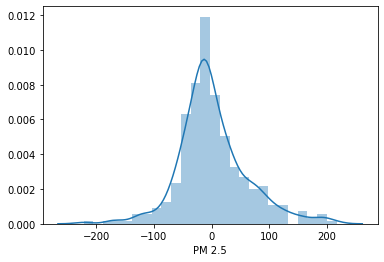

In [98]:
sns.distplot(Y_test-prediction_dtree_pruned)

## A more generalized model.

In [99]:
print("Mean Absolute Error (MAE) for Decision Tree : ", metrics.mean_absolute_error(Y_test, prediction_dtree_pruned))
print("Mean Squared Error (MSE) for Decision Tree : ", metrics.mean_squared_error(Y_test, prediction_dtree_pruned))
print("Root Mean Squared Error (RMSE) for Decision Tree : ", np.sqrt(metrics.mean_squared_error(Y_test, prediction_dtree_pruned)))

Mean Absolute Error (MAE) for Decision Tree :  43.67340037597752
Mean Squared Error (MSE) for Decision Tree :  3681.230299362538
Root Mean Squared Error (RMSE) for Decision Tree :  60.67314314721579


# Pickling - Decision Trees

In [100]:
# open a file, where you want to store the data
file = open('Decison_Tree_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(dtree_search, file)

<IPython.core.display.Javascript object>

===================================================================================================================================================================

# Random Forest Regression.

In [101]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree

In [102]:
RF_regressor =  RandomForestRegressor()
RF_reg = RF_regressor.fit(X_train,Y_train)

In [103]:
print(RF_reg)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)


In [104]:
RF_reg.estimators_

[DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1283512940, splitter='best'),
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1373270058, splitter='best'),
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features='auto', max_leaf_nodes=None,
                       min_impur

In [105]:
len(RF_reg.estimators_)

100

[Text(370.4282091012492, 528.5, 'X[0] <= 24.25\nmse = 6336.99\nsamples = 467\nvalue = 110.953'),
 Text(222.01246698604254, 498.3, 'X[5] <= 1.85\nmse = 6015.214\nsamples = 195\nvalue = 176.178'),
 Text(152.3851668530228, 468.1, 'X[5] <= 1.2\nmse = 5346.242\nsamples = 146\nvalue = 191.654'),
 Text(107.68678188618136, 437.9, 'X[2] <= 15.7\nmse = 4241.053\nsamples = 84\nvalue = 208.717'),
 Text(74.15240399444787, 407.70000000000005, 'X[1] <= 31.45\nmse = 3924.307\nsamples = 78\nvalue = 202.166'),
 Text(50.81186381863047, 377.5, 'X[6] <= 0.8\nmse = 3609.645\nsamples = 75\nvalue = 207.38'),
 Text(10.326958667489203, 347.3, 'X[7] <= 5.55\nmse = 4199.29\nsamples = 7\nvalue = 270.27'),
 Text(8.261566933991363, 317.1, 'X[0] <= 15.0\nmse = 1586.095\nsamples = 5\nvalue = 238.596'),
 Text(4.130783466995681, 286.9, 'X[5] <= 0.65\nmse = 33.11\nsamples = 2\nvalue = 282.662'),
 Text(2.0653917334978407, 256.7, 'mse = 0.0\nsamples = 1\nvalue = 288.417'),
 Text(6.196175200493522, 256.7, 'mse = 0.0\nsample

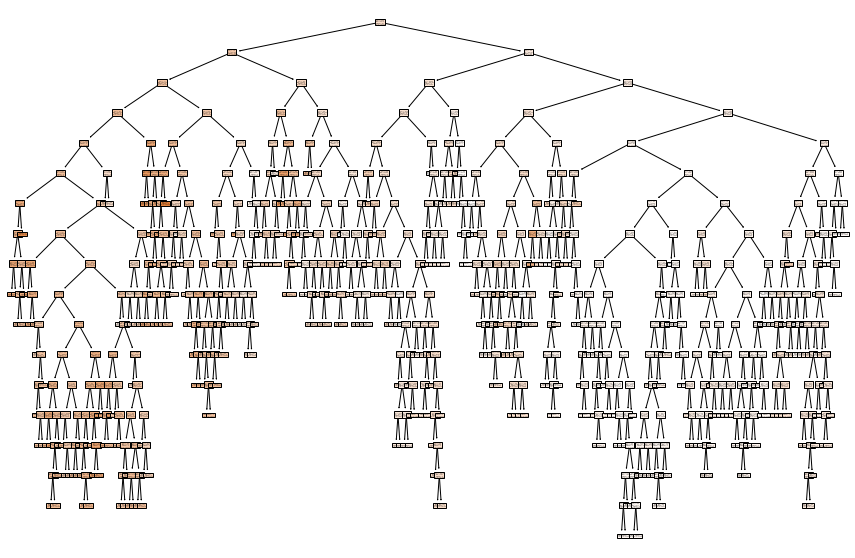

In [106]:
plt.figure(figsize=(15,10))
tree.plot_tree(RF_reg.estimators_[99],filled=True)

In [107]:
for i in range(len(RF_reg.estimators_)):
    print(tree.export_text(RF_reg.estimators_[i]))

|--- feature_0 <= 24.40
|   |--- feature_5 <= 1.70
|   |   |--- feature_6 <= 9.10
|   |   |   |--- feature_5 <= 1.20
|   |   |   |   |--- feature_3 <= 1017.25
|   |   |   |   |   |--- feature_6 <= 1.40
|   |   |   |   |   |   |--- feature_3 <= 1014.90
|   |   |   |   |   |   |   |--- feature_4 <= 81.50
|   |   |   |   |   |   |   |   |--- feature_6 <= 0.75
|   |   |   |   |   |   |   |   |   |--- value: [261.67]
|   |   |   |   |   |   |   |   |--- feature_6 >  0.75
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 17.10
|   |   |   |   |   |   |   |   |   |   |--- value: [239.12]
|   |   |   |   |   |   |   |   |   |--- feature_0 >  17.10
|   |   |   |   |   |   |   |   |   |   |--- value: [237.62]
|   |   |   |   |   |   |   |--- feature_4 >  81.50
|   |   |   |   |   |   |   |   |--- value: [202.88]
|   |   |   |   |   |   |--- feature_3 >  1014.90
|   |   |   |   |   |   |   |--- feature_5 <= 0.70
|   |   |   |   |   |   |   |   |--- feature_2 <= 11.85
|   |   |   |   |   |   |

|--- feature_5 <= 1.35
|   |--- feature_1 <= 31.65
|   |   |--- feature_6 <= 5.10
|   |   |   |--- feature_7 <= 6.50
|   |   |   |   |--- feature_5 <= 0.65
|   |   |   |   |   |--- feature_5 <= 0.40
|   |   |   |   |   |   |--- value: [376.92]
|   |   |   |   |   |--- feature_5 >  0.40
|   |   |   |   |   |   |--- feature_1 <= 16.90
|   |   |   |   |   |   |   |--- feature_6 <= 0.95
|   |   |   |   |   |   |   |   |--- value: [288.42]
|   |   |   |   |   |   |   |--- feature_6 >  0.95
|   |   |   |   |   |   |   |   |--- value: [272.12]
|   |   |   |   |   |   |--- feature_1 >  16.90
|   |   |   |   |   |   |   |--- feature_2 <= 10.70
|   |   |   |   |   |   |   |   |--- value: [310.25]
|   |   |   |   |   |   |   |--- feature_2 >  10.70
|   |   |   |   |   |   |   |   |--- value: [309.38]
|   |   |   |   |--- feature_5 >  0.65
|   |   |   |   |   |--- feature_4 <= 76.50
|   |   |   |   |   |   |--- feature_1 <= 28.00
|   |   |   |   |   |   |   |--- feature_4 <= 72.00
|   |   |   |   

|--- feature_0 <= 22.55
|   |--- feature_2 <= 12.60
|   |   |--- feature_2 <= 10.55
|   |   |   |--- feature_6 <= 2.30
|   |   |   |   |--- feature_7 <= 8.50
|   |   |   |   |   |--- feature_6 <= 1.60
|   |   |   |   |   |   |--- feature_1 <= 18.25
|   |   |   |   |   |   |   |--- value: [310.25]
|   |   |   |   |   |   |--- feature_1 >  18.25
|   |   |   |   |   |   |   |--- feature_6 <= 1.00
|   |   |   |   |   |   |   |   |--- feature_6 <= 0.80
|   |   |   |   |   |   |   |   |   |--- value: [202.88]
|   |   |   |   |   |   |   |   |--- feature_6 >  0.80
|   |   |   |   |   |   |   |   |   |--- feature_1 <= 22.80
|   |   |   |   |   |   |   |   |   |   |--- value: [214.04]
|   |   |   |   |   |   |   |   |   |--- feature_1 >  22.80
|   |   |   |   |   |   |   |   |   |   |--- value: [221.54]
|   |   |   |   |   |   |   |--- feature_6 >  1.00
|   |   |   |   |   |   |   |   |--- feature_2 <= 6.65
|   |   |   |   |   |   |   |   |   |--- value: [253.29]
|   |   |   |   |   |   |   |  

|--- feature_0 <= 24.40
|   |--- feature_5 <= 1.35
|   |   |--- feature_0 <= 14.70
|   |   |   |--- feature_3 <= 1016.20
|   |   |   |   |--- feature_0 <= 13.45
|   |   |   |   |   |--- feature_6 <= 4.25
|   |   |   |   |   |   |--- value: [143.00]
|   |   |   |   |   |--- feature_6 >  4.25
|   |   |   |   |   |   |--- feature_1 <= 20.80
|   |   |   |   |   |   |   |--- value: [108.00]
|   |   |   |   |   |   |--- feature_1 >  20.80
|   |   |   |   |   |   |   |--- value: [116.46]
|   |   |   |   |--- feature_0 >  13.45
|   |   |   |   |   |--- feature_4 <= 91.50
|   |   |   |   |   |   |--- feature_0 <= 14.20
|   |   |   |   |   |   |   |--- value: [143.92]
|   |   |   |   |   |   |--- feature_0 >  14.20
|   |   |   |   |   |   |   |--- value: [152.55]
|   |   |   |   |   |--- feature_4 >  91.50
|   |   |   |   |   |   |--- value: [169.00]
|   |   |   |--- feature_3 >  1016.20
|   |   |   |   |--- feature_7 <= 5.55
|   |   |   |   |   |--- feature_3 <= 1017.50
|   |   |   |   |   |   

|--- feature_0 <= 23.05
|   |--- feature_5 <= 1.05
|   |   |--- feature_4 <= 83.50
|   |   |   |--- feature_1 <= 21.05
|   |   |   |   |--- feature_2 <= 6.35
|   |   |   |   |   |--- feature_1 <= 19.85
|   |   |   |   |   |   |--- feature_3 <= 1019.00
|   |   |   |   |   |   |   |--- feature_5 <= 0.65
|   |   |   |   |   |   |   |   |--- value: [228.79]
|   |   |   |   |   |   |   |--- feature_5 >  0.65
|   |   |   |   |   |   |   |   |--- feature_4 <= 77.00
|   |   |   |   |   |   |   |   |   |--- value: [223.21]
|   |   |   |   |   |   |   |   |--- feature_4 >  77.00
|   |   |   |   |   |   |   |   |   |--- value: [223.25]
|   |   |   |   |   |   |--- feature_3 >  1019.00
|   |   |   |   |   |   |   |--- value: [214.04]
|   |   |   |   |   |--- feature_1 >  19.85
|   |   |   |   |   |   |--- value: [264.92]
|   |   |   |   |--- feature_2 >  6.35
|   |   |   |   |   |--- feature_4 <= 80.50
|   |   |   |   |   |   |--- feature_7 <= 12.05
|   |   |   |   |   |   |   |--- feature_3 <= 10

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Now lets see what over-fitting in Random Forest looks like. R-squared value on the training set.

In [108]:
print("Coefficient of Determination R-Squared on train set using Random Forest regressor: {}".format(RF_regressor.score(X_train,Y_train)))

Coefficient of Determination R-Squared on train set using Random Forest regressor: 0.9729285433702579


In [109]:
print("Coefficient of Determination R-Squared on train set using Random Forest regressor: {}".format(RF_regressor.score(X_test,Y_test)))

Coefficient of Determination R-Squared on train set using Random Forest regressor: 0.7838267931647852


## Cross-Validation

In [110]:
from sklearn.model_selection import cross_val_score
RF_score = cross_val_score(RF_regressor,X,Y,cv=5) 

In [111]:
RF_score.mean()

0.7330808197810776

# Model Evaluation

In [112]:
RF_prediction = RF_regressor.predict(X_test)

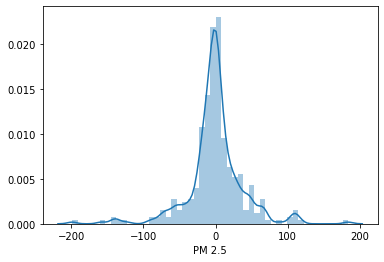

In [113]:
sns.distplot(Y_test - RF_prediction)

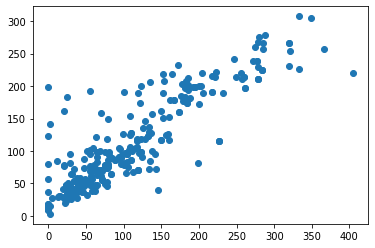

In [114]:
plt.scatter(Y_test,RF_prediction)

# Hyper Parameter Tuning

In [115]:
from sklearn.model_selection import RandomizedSearchCV

## Randomized search is also faster than Grid search CV

In [116]:
#List comprehension used to select 12 random numbers between start and stop 
n_estimators= [int(x) for x in np.linspace(start = 100, stop = 1300, num=12)]
print(n_estimators)

[100, 209, 318, 427, 536, 645, 754, 863, 972, 1081, 1190, 1300]


In [117]:
#Number of trees in random forest
n_estimators= [int(x) for x in np.linspace(start = 100, stop = 1200, num=12)]
#Number of features to consider at each split.
max_features = ['auto','sqrt']
# Maximum number of levels in a tree
max_depth = [int(x) for x in np.linspace(5,30, num=6)]
#max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split= [2,5,10,15,100]
# Minimum number of samples required at each leaf
min_samples_leaf = [1,2,3,4,5,6,7,8,9,10]

In [118]:
# Create the random Grid (Dictionary)

random_grid = {'n_estimators'      : n_estimators,
              'max_features'      : max_features,
              'max_depth'         : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf'  : min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}


In [119]:
#Use the random grid to search for best parameters.
#First create the base model to tune.
RF = RandomForestRegressor()

In [120]:
#Random search of parameters using 3 fold cross validations.
#Search across 100 different combinations.
RF_Random_Search= RandomizedSearchCV(estimator= RF, param_distributions=random_grid,scoring='neg_mean_squared_error',n_iter=100,cv=5,verbose=3,random_state=40)

## To calculate the time.

In [121]:
def timer(Start_time=None):
    if not Start_time:
        Start_time=datetime.now()
        return Start_time
    elif Start_time:
        thour, temp_sec = divmod((datetime.now()-Start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec,60)
        print('\n Time taken: {} hours {} minutes {} seconds'.format(thour,  tmin, round(tsec,2)))

## There are 100 iterations and 5 CV so 500 fits.

In [122]:
from datetime import datetime
Start_time = timer(None) #Training time starts now
RF_Random_Search.fit(X_train,Y_train)
timer(Start_time)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20, score=-1949.766, total=   0.8s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20, score=-1973.377, total=   0.8s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s remaining:    0.0s


[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20, score=-1865.047, total=   0.9s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20, score=-1869.487, total=   0.9s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=20, score=-2422.798, total=   0.8s
[CV] n_estimators=200, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=25 
[CV]  n_estimators=200, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=25, score=-2773.303, total=   0.4s
[CV] n_estimators=200, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=25 
[CV]  n_estimators=200, min_samples_split=100, min_samples_leaf=1, max_features=auto,

[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=auto, max_depth=10, score=-2080.246, total=   3.1s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=auto, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=auto, max_depth=10, score=-2694.765, total=   2.9s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=10 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=10, score=-1958.365, total=   1.1s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=10 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=10, score=-1711.503, total=   1.1s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=10 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_de

[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5, score=-2130.825, total=   1.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5, score=-2071.952, total=   1.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5, score=-1974.620, total=   1.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5, score=-2078.402, total=   1.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=5, score=-

[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-2905.523, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-3004.741, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-2759.667, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-3268.435, total=   0.8s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_features=auto, max_depth=30 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_features=auto

[CV]  n_estimators=400, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=15, score=-1891.037, total=   1.1s
[CV] n_estimators=400, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=15 
[CV]  n_estimators=400, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=15, score=-1884.210, total=   1.1s
[CV] n_estimators=400, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=15 
[CV]  n_estimators=400, min_samples_split=15, min_samples_leaf=5, max_features=auto, max_depth=15, score=-2413.603, total=   1.1s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=3, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=3, max_features=sqrt, max_depth=15, score=-3024.604, total=   1.9s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=3, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=3, max_features=s

[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=auto, max_depth=30, score=-1772.706, total=   0.9s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=auto, max_depth=30 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=auto, max_depth=30, score=-2234.975, total=   0.8s
[CV] n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30 
[CV]  n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, score=-1800.576, total=   2.3s
[CV] n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30 
[CV]  n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, score=-1608.731, total=   2.4s
[CV] n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30 
[CV]  n_estimators=1100, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max

[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20, score=-2467.877, total=   1.9s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20, score=-2811.848, total=   1.8s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20, score=-2972.512, total=   1.9s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20, score=-2699.455, total=   2.0s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=auto, max_depth=20 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=9, max_features=

[CV]  n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30, score=-2232.884, total=   1.7s
[CV] n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30 
[CV]  n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30, score=-2219.252, total=   1.5s
[CV] n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30 
[CV]  n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30, score=-2158.478, total=   1.4s
[CV] n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30 
[CV]  n_estimators=600, min_samples_split=15, min_samples_leaf=8, max_features=sqrt, max_depth=30, score=-2742.286, total=   1.2s
[CV] n_estimators=700, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=20 
[CV]  n_estimators=700, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, m

[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=10, score=-1926.248, total=   1.8s
[CV] n_estimators=900, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=10 
[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=10, score=-1874.569, total=   1.9s
[CV] n_estimators=900, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=10 
[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=10, score=-2462.242, total=   1.9s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=4, max_features=sqrt, max_depth=10 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=4, max_features=sqrt, max_depth=10, score=-3042.632, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=4, max_features=sqrt, max_depth=10 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=4, max_features=sqrt,

[CV]  n_estimators=1000, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=20, score=-1406.621, total=   2.3s
[CV] n_estimators=1000, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=20 
[CV]  n_estimators=1000, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=20, score=-1990.773, total=   2.3s
[CV] n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-3112.818, total=   0.3s
[CV] n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, score=-2894.023, total=   0.3s
[CV] n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=200, min_samples_split=100, min_samples_leaf=10, max_features=sq

[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15, score=-3049.516, total=   1.9s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15, score=-2890.316, total=   1.9s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15, score=-2969.733, total=   2.0s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15, score=-2733.589, total=   1.9s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf

[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15, score=-2987.154, total=   1.4s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15, score=-2672.016, total=   1.6s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15, score=-2703.313, total=   1.6s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=1, max_features=auto, max_depth=15, score=-3275.853, total=   1.3s
[CV] n_estimators=1100, min_samples_split=10, min_samples_leaf=8, max_features=auto, max_depth=15 
[CV]  n_estimators=1100, min_samples_split=10, min_samples_leaf=8, max_features=

[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=3, max_features=auto, max_depth=10, score=-1594.388, total=   2.6s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=3, max_features=auto, max_depth=10 
[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=3, max_features=auto, max_depth=10, score=-1606.674, total=   2.6s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=3, max_features=auto, max_depth=10 
[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=3, max_features=auto, max_depth=10, score=-2067.749, total=   2.6s
[CV] n_estimators=800, min_samples_split=2, min_samples_leaf=2, max_features=auto, max_depth=25 
[CV]  n_estimators=800, min_samples_split=2, min_samples_leaf=2, max_features=auto, max_depth=25, score=-1597.322, total=   2.7s
[CV] n_estimators=800, min_samples_split=2, min_samples_leaf=2, max_features=auto, max_depth=25 
[CV]  n_estimators=800, min_samples_split=2, min_samples_leaf=2, max_features=auto, max_depth=25

[CV]  n_estimators=1200, min_samples_split=5, min_samples_leaf=3, max_features=sqrt, max_depth=5, score=-2844.074, total=   2.1s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25, score=-2812.234, total=   1.0s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25, score=-2977.521, total=   1.1s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25, score=-2706.768, total=   1.1s
[CV] n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_features=auto, max_depth=25 
[CV]  n_estimators=500, min_samples_split=100, min_samples_leaf=10, max_fea

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 13.4min finished



 Time taken: 0.0 hours 13.0 minutes 23.59 seconds


In [123]:
RF_Random_Search.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

In [124]:
RF_Random_Search.best_score_

-1543.5898461651557

In [125]:
RF_predict=RF_Random_Search.predict(X_test)

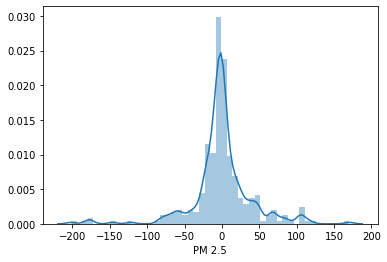

In [126]:
sns.distplot(Y_test-RF_predict)

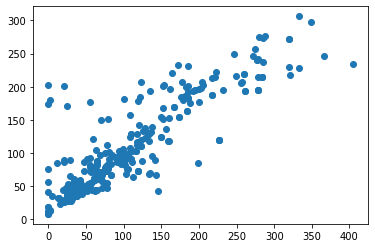

In [127]:
plt.scatter(Y_test,RF_predict)

In [128]:
print("Mean Absolute Error (MAE) for Random Forest : ", metrics.mean_absolute_error(Y_test, RF_predict))
print("Mean Squared Error (MSE) for Random Forest : ", metrics.mean_squared_error(Y_test, RF_predict))
print("Root Mean Squared Error (RMSE) for Random Forest : ", np.sqrt(metrics.mean_squared_error(Y_test, RF_predict)))

Mean Absolute Error (MAE) for Random Forest :  24.50873767741731
Mean Squared Error (MSE) for Random Forest :  1663.7060100578979
Root Mean Squared Error (RMSE) for Random Forest :  40.788552438863256


# Pickling

In [129]:
# open a file, where you want to store the data
file = open('Random_Forest_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(RF_Random_Search, file)

<IPython.core.display.Javascript object>

===================================================================================================================================================================

# XGBoost Regressor.

In [130]:
import xgboost as xgb

In [131]:
xgb_regressor = xgb.XGBRegressor()
xgb_regressor.fit(X_train,Y_train)

[01:57:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

# Checking the R-square

In [132]:
print("Coefficient of Determination R-Squared on train set using XGBoost regressor: {}".format(xgb_regressor.score(X_train,Y_train)))

Coefficient of Determination R-Squared on train set using XGBoost regressor: 0.8606305938167513


In [133]:
print("Coefficient of Determination R-Squared on test set using XGBoost regressor: {}".format(xgb_regressor.score(X_test,Y_test)))

Coefficient of Determination R-Squared on test set using XGBoost regressor: 0.7210652962292528


# Perform Cross-Validation

In [134]:
from sklearn.model_selection import cross_val_score
XGB_score = cross_val_score(xgb_regressor,X,Y,cv=5)

/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[01:57:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:57:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[01:57:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:57:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[01:57:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [135]:
XGB_score.mean()

0.6582827367763413

# Model Evaluation.

In [136]:
xgb_predict=xgb_regressor.predict(X_test)

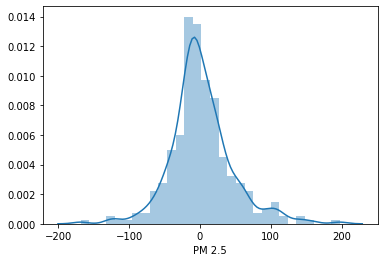

In [137]:
sns.distplot(Y_test - xgb_predict)

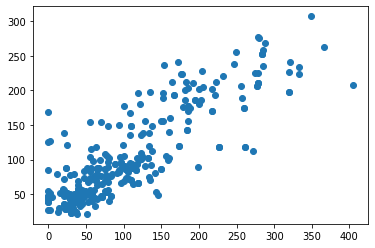

In [138]:
plt.scatter(Y_test,xgb_predict)

## HyperParameter Tuning of XGBoost

In [139]:
from sklearn.model_selection import RandomizedSearchCV

In [140]:
#List comprehension used to select 12 random numbers between start and stop 
n_estimators= [int(x) for x in np.linspace(start = 100, stop = 1300, num=12)]
print(n_estimators)

[100, 209, 318, 427, 536, 645, 754, 863, 972, 1081, 1190, 1300]


In [141]:
#Number of decision trees in XGBoost
n_estimators= [int(x) for x in np.linspace(start = 100, stop = 1200, num=12)]
#Various learning rate Parameters
learning_rate=['0.05','0.01','0.5','0.1','0.2','0.3','0.4','0.5','0.6']
# Maximum number of levels in a tree
max_depth = [int(x) for x in np.linspace(5,30, num=6)]
#max_depth.append(None)
#Subsample parameter values
subsample=[0.5,0.6,0.7,0.8,0.9]
# Minimum child weight parameters
min_child_weight = [1,2,3,4,5,6,7,8,9,10]

In [142]:
#Create the random Grid

random_grid_XGB = {'n_estimators'      : n_estimators,
                   'learning_rate'     : learning_rate,
                   'max_depth'         : max_depth,
                   'subsample'         : subsample,
                   'min_child_weight'  : min_child_weight}

print(random_grid_XGB)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'learning_rate': ['0.05', '0.01', '0.5', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.5, 0.6, 0.7, 0.8, 0.9], 'min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}


In [143]:
#Tune the base model
XGB = xgb.XGBRegressor()

In [144]:
XGB_Randomized_Search = RandomizedSearchCV(estimator=XGB, param_distributions=random_grid_XGB,scoring='neg_mean_squared_error',n_iter=100,cv=5,verbose=3,random_state=50)

## Calculate the time

In [145]:
def timer(Start_time=None):
    if not Start_time:
        Start_time=datetime.now()
        return Start_time
    elif Start_time:
        thour, temp_sec = divmod((datetime.now()-Start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec,60)
        print('\n Time taken: {} hours {} minutes {} seconds'.format(thour,  tmin, round(tsec,2)))

In [146]:
from datetime import datetime
Start_time = timer(None) #Training time starts now
XGB_Randomized_Search.fit(X_train,Y_train)
timer(Start_time)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1 
[01:57:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1, score=-1393.603, total=   0.9s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1 
[01:57:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1, score=-1328.075, total=   0.9s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1 
[01:57:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s remaining:    0.0s
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1, score=-1599.488, total=   1.0s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1 
[01:57:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1, score=-1244.395, total=   0.9s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1 
[01:57:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=30, learning_rate=0.1, score=-1872.723, total=   0.9s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:57:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1477.811, total=   0.7s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:57:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1426.813, total=   0.7s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:57:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1520.182, total=   0.7s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:57:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1372.446, total=   0.8s
[CV] subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:57:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=500, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1909.324, total=   0.8s
[CV] subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5 
[01:57:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-2125.252, total=   1.1s
[CV] subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5 
[01:57:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1928.293, total=   1.3s
[CV] subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5 
[01:57:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1874.591, total=   1.0s
[CV] subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5 
[01:57:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1933.535, total=   1.5s
[CV] subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5 
[01:57:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1808.899, total=   1.2s
[CV] subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1746.095, total=   0.6s
[CV] subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1548.857, total=   0.8s
[CV] subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1827.413, total=   0.7s
[CV] subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1697.199, total=   0.8s
[CV] subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-2470.725, total=   0.8s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2 
[01:57:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2, score=-1908.667, total=   0.8s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2 
[01:57:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2, score=-1216.500, total=   0.6s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2 
[01:57:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2, score=-1585.154, total=   0.6s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2 
[01:57:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2, score=-1465.342, total=   0.7s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2 
[01:57:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=1, max_depth=15, learning_rate=0.2, score=-1671.215, total=   0.6s
[CV] subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5 
[01:57:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5, score=-2022.695, total=   0.6s
[CV] subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5 
[01:57:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5, score=-2223.760, total=   0.6s
[CV] subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5 
[01:57:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5, score=-2414.189, total=   0.6s
[CV] subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5 
[01:57:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5, score=-1389.045, total=   0.7s
[CV] subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5 
[01:57:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=4, max_depth=15, learning_rate=0.5, score=-2090.533, total=   0.6s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4 
[01:57:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1928.374, total=   0.6s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4 
[01:57:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1411.661, total=   0.6s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4 
[01:57:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1865.714, total=   0.6s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4 
[01:57:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1379.751, total=   0.6s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4 
[01:57:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1789.645, total=   0.6s
[CV] subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4 
[01:57:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4, score=-1749.424, total=   1.0s
[CV] subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4 
[01:57:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4, score=-1418.520, total=   0.8s
[CV] subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4 
[01:57:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4, score=-1605.882, total=   0.8s
[CV] subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4 
[01:57:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4, score=-1472.564, total=   1.2s
[CV] subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4 
[01:57:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=800, min_child_weight=7, max_depth=10, learning_rate=0.4, score=-1999.116, total=   1.2s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2 
[01:57:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2, score=-1679.606, total=   0.9s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2 
[01:57:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2, score=-1378.899, total=   0.9s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2 
[01:57:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2, score=-1631.639, total=   0.9s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2 
[01:57:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2, score=-1508.841, total=   0.9s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2 
[01:57:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=3, max_depth=5, learning_rate=0.2, score=-1808.653, total=   0.8s
[CV] subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5 
[01:57:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5, score=-1938.361, total=   0.7s
[CV] subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5 
[01:57:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5, score=-1521.175, total=   0.9s
[CV] subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5 
[01:57:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5, score=-1774.899, total=   0.7s
[CV] subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5 
[01:57:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5, score=-1789.787, total=   0.7s
[CV] subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5 
[01:57:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=8, max_depth=10, learning_rate=0.5, score=-2116.861, total=   1.1s
[CV] subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6 
[01:57:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6, score=-1635.849, total=   0.8s
[CV] subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6 
[01:57:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6, score=-1901.835, total=   0.6s
[CV] subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6 
[01:57:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6, score=-2240.299, total=   0.6s
[CV] subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6 
[01:57:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6, score=-1891.675, total=   0.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6 
[01:57:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=4, max_depth=30, learning_rate=0.6, score=-3022.846, total=   0.8s
[CV] subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5 
[01:57:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5, score=-2159.679, total=   0.5s
[CV] subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5 
[01:57:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5, score=-1477.164, total=   0.5s
[CV] subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5 
[01:57:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5, score=-1932.168, total=   0.5s
[CV] subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5 
[01:57:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5, score=-1486.031, total=   0.5s
[CV] subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5 
[01:57:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1200, min_child_weight=2, max_depth=10, learning_rate=0.5, score=-2058.683, total=   0.5s
[CV] subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:57:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-2288.270, total=   0.5s
[CV] subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:57:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1676.931, total=   0.5s
[CV] subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:57:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1937.651, total=   0.5s
[CV] subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:57:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1752.166, total=   0.5s
[CV] subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:57:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=900, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-2121.135, total=   0.5s
[CV] subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1 
[01:57:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1, score=-1563.919, total=   0.1s
[CV] subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1 
[01:57:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1, score=-1261.184, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1 
[01:57:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1, score=-1580.868, total=   0.1s
[CV] subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1, score=-1386.543, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.7, n_estimators=100, min_child_weight=3, max_depth=10, learning_rate=0.1, score=-1796.924, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1810.573, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1594.259, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1744.081, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1561.309, total=   0.1s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4 
[01:57:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.4, score=-1960.288, total=   0.2s
[CV] subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4 
[01:58:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4, score=-1640.139, total=   1.1s
[CV] subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4 
[01:58:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4, score=-1531.323, total=   1.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4 
[01:58:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4, score=-2052.345, total=   1.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4 
[01:58:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4, score=-1627.767, total=   1.7s
[CV] subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4 
[01:58:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=7, max_depth=20, learning_rate=0.4, score=-2101.928, total=   1.6s
[CV] subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05 
[01:58:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05, score=-1462.267, total=   0.8s
[CV] subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05 
[01:58:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05, score=-1260.010, total=   0.9s
[CV] subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05 
[01:58:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05, score=-1521.313, total=   0.9s
[CV] subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05 
[01:58:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05, score=-1453.227, total=   0.8s
[CV] subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05 
[01:58:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=6, max_depth=20, learning_rate=0.05, score=-1754.956, total=   0.8s
[CV] subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5 
[01:58:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5, score=-1811.420, total=   0.4s
[CV] subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5 
[01:58:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5, score=-1796.428, total=   0.4s
[CV] subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5 
[01:58:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5, score=-1824.002, total=   0.5s
[CV] subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5 
[01:58:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5, score=-1796.263, total=   0.4s
[CV] subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5 
[01:58:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=3, max_depth=15, learning_rate=0.5, score=-1906.211, total=   0.4s
[CV] subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2 
[01:58:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2, score=-1757.698, total=   1.5s
[CV] subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2 
[01:58:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2, score=-1276.901, total=   1.4s
[CV] subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2 
[01:58:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2, score=-1664.288, total=   1.4s
[CV] subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2 
[01:58:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2, score=-1433.217, total=   1.4s
[CV] subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2 
[01:58:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=900, min_child_weight=8, max_depth=30, learning_rate=0.2, score=-2149.228, total=   1.4s
[CV] subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3 
[01:58:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3, score=-1443.510, total=   1.0s
[CV] subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3 
[01:58:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3, score=-1348.458, total=   0.9s
[CV] subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3 
[01:58:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3, score=-1793.818, total=   1.0s
[CV] subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3 
[01:58:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3, score=-1777.496, total=   0.9s
[CV] subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3 
[01:58:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=4, max_depth=15, learning_rate=0.3, score=-2335.676, total=   1.0s
[CV] subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5 
[01:58:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5, score=-1944.887, total=   0.6s
[CV] subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5 
[01:58:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5, score=-1630.308, total=   1.0s
[CV] subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5 
[01:58:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5, score=-1939.864, total=   0.8s
[CV] subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5 
[01:58:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5, score=-1638.180, total=   1.1s
[CV] subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5 
[01:58:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=4, max_depth=25, learning_rate=0.5, score=-2317.821, total=   0.7s
[CV] subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2 
[01:58:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2, score=-1580.250, total=   0.5s
[CV] subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2 
[01:58:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2, score=-1284.629, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2 
[01:58:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2, score=-1771.529, total=   0.5s
[CV] subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2 
[01:58:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2, score=-1545.956, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2 
[01:58:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=4, max_depth=25, learning_rate=0.2, score=-1998.893, total=   0.5s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3 
[01:58:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3, score=-1561.283, total=   0.7s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3 
[01:58:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3, score=-1323.222, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3 
[01:58:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3, score=-1709.541, total=   0.7s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3 
[01:58:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3, score=-1753.988, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3 
[01:58:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=10, max_depth=5, learning_rate=0.3, score=-2125.217, total=   0.8s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3 
[01:58:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3, score=-1503.307, total=   1.3s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3 
[01:58:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3, score=-1327.940, total=   1.4s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3 
[01:58:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3, score=-1725.500, total=   1.6s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3 
[01:58:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3, score=-1647.175, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3 
[01:58:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=25, learning_rate=0.3, score=-1883.044, total=   0.9s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4 
[01:58:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4, score=-2026.155, total=   1.4s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4 
[01:58:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4, score=-1813.191, total=   1.4s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4 
[01:58:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4, score=-1809.069, total=   1.5s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4 
[01:58:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4, score=-1528.951, total=   1.1s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4 
[01:58:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.4, score=-2302.605, total=   1.3s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05 
[01:58:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05, score=-1455.433, total=   2.0s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05 
[01:58:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05, score=-1241.661, total=   2.1s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05 
[01:58:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05, score=-1604.658, total=   2.1s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05 
[01:58:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05, score=-1370.649, total=   2.0s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05 
[01:58:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=8, max_depth=30, learning_rate=0.05, score=-1771.729, total=   1.9s
[CV] subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3 
[01:59:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3, score=-1620.610, total=   1.6s
[CV] subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3 
[01:59:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3, score=-1571.041, total=   1.6s
[CV] subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3 
[01:59:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3, score=-1660.658, total=   1.6s
[CV] subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3 
[01:59:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3, score=-1583.361, total=   1.8s
[CV] subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3 
[01:59:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.3, score=-2037.716, total=   1.9s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5 
[01:59:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5, score=-1792.972, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5 
[01:59:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5, score=-1643.465, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5 
[01:59:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5, score=-1797.513, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5 
[01:59:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5, score=-1671.717, total=   0.2s
[CV] subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5 


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[01:59:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.8, n_estimators=100, min_child_weight=8, max_depth=20, learning_rate=0.5, score=-2210.081, total=   0.2s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1 


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[01:59:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1, score=-1446.411, total=   0.9s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1 
[01:59:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1, score=-1151.874, total=   0.8s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1 
[01:59:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1, score=-1336.289, total=   0.8s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1 
[01:59:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1, score=-1300.292, total=   0.8s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1 
[01:59:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=30, learning_rate=0.1, score=-1754.230, total=   0.8s
[CV] subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4 
[01:59:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4, score=-1853.046, total=   0.3s
[CV] subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4 
[01:59:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4, score=-1360.139, total=   0.2s
[CV] subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4 
[01:59:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4, score=-1538.387, total=   0.2s
[CV] subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4 
[01:59:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4, score=-1643.990, total=   0.2s
[CV] subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4 
[01:59:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=2, max_depth=15, learning_rate=0.4, score=-1726.872, total=   0.2s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6 
[01:59:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6, score=-2204.441, total=   0.6s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6 
[01:59:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6, score=-2072.078, total=   0.6s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6 
[01:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6, score=-1951.040, total=   0.6s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6 
[01:59:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6, score=-1898.744, total=   0.6s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6 
[01:59:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=30, learning_rate=0.6, score=-2711.766, total=   0.5s
[CV] subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6 
[01:59:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6, score=-2007.092, total=   0.9s
[CV] subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6 
[01:59:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6, score=-1922.448, total=   1.1s
[CV] subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6 
[01:59:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6, score=-2096.646, total=   0.9s
[CV] subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6 
[01:59:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6, score=-2049.605, total=   0.8s
[CV] subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6 
[01:59:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=8, max_depth=25, learning_rate=0.6, score=-2544.360, total=   1.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5 
[01:59:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5, score=-2220.872, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5 
[01:59:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5, score=-1815.575, total=   0.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5 
[01:59:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5, score=-1971.352, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5 
[01:59:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5, score=-1979.711, total=   0.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5 
[01:59:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=7, max_depth=30, learning_rate=0.5, score=-2923.570, total=   0.2s
[CV] subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01 
[01:59:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01, score=-1541.589, total=   0.6s
[CV] subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01 
[01:59:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01, score=-1482.721, total=   0.8s
[CV] subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01 
[01:59:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01, score=-1548.058, total=   0.7s
[CV] subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01 
[01:59:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01, score=-1455.537, total=   0.7s
[CV] subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01 
[01:59:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=400, min_child_weight=6, max_depth=15, learning_rate=0.01, score=-1887.300, total=   0.7s
[CV] subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2 
[01:59:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2, score=-1406.756, total=   0.9s
[CV] subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2 
[01:59:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2, score=-1211.405, total=   0.9s
[CV] subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2 
[01:59:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2, score=-1905.137, total=   0.9s
[CV] subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2 
[01:59:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2, score=-1550.612, total=   0.8s
[CV] subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2 
[01:59:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=700, min_child_weight=2, max_depth=25, learning_rate=0.2, score=-1808.714, total=   0.9s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3 
[01:59:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3, score=-1815.744, total=   1.7s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3 
[01:59:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3, score=-1563.386, total=   2.0s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3 
[01:59:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3, score=-1699.612, total=   1.9s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3 
[01:59:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3, score=-1569.724, total=   1.8s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3 
[01:59:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=25, learning_rate=0.3, score=-1942.205, total=   1.9s
[CV] subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1 
[01:59:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1329.093, total=   0.5s
[CV] subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1 
[01:59:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1365.833, total=   0.5s
[CV] subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1 
[01:59:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1411.257, total=   0.5s
[CV] subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1 
[01:59:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1329.952, total=   0.5s
[CV] subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1 
[01:59:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1921.760, total=   0.5s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3 
[01:59:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3, score=-1562.799, total=   1.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3 
[01:59:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3, score=-1326.215, total=   1.5s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3 
[01:59:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3, score=-1684.382, total=   1.4s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3 
[01:59:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3, score=-1626.111, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3 
[01:59:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=5, max_depth=20, learning_rate=0.3, score=-1934.036, total=   0.9s
[CV] subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[01:59:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1484.336, total=   0.3s
[CV] subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[01:59:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1385.749, total=   0.3s
[CV] subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[01:59:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1576.048, total=   0.3s
[CV] subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[01:59:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1468.626, total=   0.3s
[CV] subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[01:59:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1952.994, total=   0.3s
[CV] subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3 
[01:59:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1522.003, total=   0.6s
[CV] subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3 
[01:59:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1429.942, total=   0.6s
[CV] subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3 
[01:59:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1951.197, total=   0.6s
[CV] subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3 
[01:59:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1469.400, total=   0.6s
[CV] subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3 
[01:59:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=300, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1765.081, total=   0.6s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:59:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-2041.053, total=   0.3s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:59:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1548.438, total=   0.3s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:59:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1595.076, total=   0.3s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:59:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1254.293, total=   0.2s
[CV] subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5 
[01:59:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=300, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1902.498, total=   0.2s
[CV] subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5 
[01:59:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5, score=-1873.561, total=   0.5s
[CV] subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5 
[01:59:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5, score=-1930.163, total=   0.5s
[CV] subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5 
[01:59:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5, score=-1820.676, total=   0.5s
[CV] subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5 
[01:59:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5, score=-2003.498, total=   0.5s
[CV] subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5 
[01:59:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=1, max_depth=25, learning_rate=0.5, score=-2233.659, total=   0.5s
[CV] subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01 
[01:59:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1496.255, total=   1.6s
[CV] subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01 
[02:00:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1219.788, total=   1.7s
[CV] subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01 
[02:00:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1421.055, total=   1.7s
[CV] subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01 
[02:00:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1374.437, total=   1.8s
[CV] subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01 
[02:00:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=4, max_depth=20, learning_rate=0.01, score=-1747.801, total=   1.7s
[CV] subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6 
[02:00:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6, score=-1866.806, total=   0.4s
[CV] subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6 
[02:00:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6, score=-1525.882, total=   0.6s
[CV] subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6 
[02:00:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6, score=-1999.947, total=   0.6s
[CV] subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6 
[02:00:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6, score=-1844.478, total=   0.6s
[CV] subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6 
[02:00:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=3, max_depth=20, learning_rate=0.6, score=-2784.505, total=   0.7s
[CV] subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2 
[02:00:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2, score=-1464.329, total=   0.5s
[CV] subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2 
[02:00:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2, score=-1374.947, total=   0.6s
[CV] subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2 
[02:00:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2, score=-1644.427, total=   0.6s
[CV] subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2 
[02:00:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2, score=-1502.694, total=   0.5s
[CV] subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2 
[02:00:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=9, max_depth=5, learning_rate=0.2, score=-1764.844, total=   0.7s
[CV] subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05 
[02:00:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05, score=-1621.253, total=   0.3s
[CV] subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05 
[02:00:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05, score=-1403.716, total=   0.3s
[CV] subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05 
[02:00:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05, score=-1619.836, total=   0.4s
[CV] subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05 
[02:00:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05, score=-1432.823, total=   0.3s
[CV] subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05 
[02:00:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=300, min_child_weight=7, max_depth=5, learning_rate=0.05, score=-1898.661, total=   0.3s
[CV] subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4 
[02:00:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4, score=-1985.222, total=   1.4s
[CV] subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4 
[02:00:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4, score=-1745.323, total=   1.4s
[CV] subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4 
[02:00:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4, score=-1774.795, total=   1.4s
[CV] subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4 
[02:00:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4, score=-1697.821, total=   1.3s
[CV] subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4 
[02:00:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=600, min_child_weight=7, max_depth=25, learning_rate=0.4, score=-2037.070, total=   1.4s
[CV] subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1 
[02:00:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1, score=-1421.515, total=   1.2s
[CV] subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1 
[02:00:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1, score=-1344.286, total=   1.1s
[CV] subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1 
[02:00:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1, score=-1630.625, total=   1.0s
[CV] subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1 
[02:00:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1, score=-1339.970, total=   1.3s
[CV] subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1 
[02:00:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=1100, min_child_weight=7, max_depth=5, learning_rate=0.1, score=-1736.797, total=   1.1s
[CV] subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05 
[02:00:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05, score=-1528.176, total=   1.1s
[CV] subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05 
[02:00:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05, score=-1293.338, total=   0.9s
[CV] subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05 
[02:00:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05, score=-1670.970, total=   0.9s
[CV] subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05 
[02:00:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05, score=-1433.304, total=   0.9s
[CV] subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05 
[02:00:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=700, min_child_weight=7, max_depth=10, learning_rate=0.05, score=-1892.230, total=   0.9s
[CV] subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3 
[02:00:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3, score=-1913.494, total=   0.7s
[CV] subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3 
[02:00:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3, score=-1842.227, total=   0.7s
[CV] subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3 
[02:00:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3, score=-1610.446, total=   0.7s
[CV] subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3 
[02:00:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3, score=-1680.768, total=   0.7s
[CV] subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3 
[02:00:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=6, max_depth=30, learning_rate=0.3, score=-2024.483, total=   0.7s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[02:00:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1499.916, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[02:00:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1285.769, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[02:00:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1621.473, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[02:00:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1409.648, total=   2.2s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1 
[02:00:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=7, max_depth=15, learning_rate=0.1, score=-1924.440, total=   2.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05 
[02:00:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05, score=-1426.088, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05 
[02:00:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05, score=-1234.969, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05 
[02:00:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05, score=-1432.518, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05 
[02:00:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05, score=-1411.633, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05 
[02:00:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=1, max_depth=20, learning_rate=0.05, score=-1724.687, total=   0.2s
[CV] subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:00:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1448.423, total=   0.4s
[CV] subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:00:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1422.685, total=   0.4s
[CV] subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:00:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1693.513, total=   0.4s
[CV] subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:00:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1778.531, total=   0.4s
[CV] subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:00:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=300, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-2106.625, total=   0.4s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:00:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1555.147, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:00:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1786.967, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:00:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1633.391, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:00:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1609.341, total=   0.8s
[CV] subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:00:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1000, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-2154.651, total=   0.8s
[CV] subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6 
[02:00:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6, score=-2399.950, total=   0.4s
[CV] subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6 
[02:00:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6, score=-1767.114, total=   0.4s
[CV] subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6 
[02:00:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6, score=-1960.534, total=   0.4s
[CV] subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6 
[02:00:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6, score=-1706.552, total=   0.4s
[CV] subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6 
[02:00:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=900, min_child_weight=1, max_depth=20, learning_rate=0.6, score=-2290.614, total=   0.4s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1 
[02:00:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1, score=-1518.749, total=   2.0s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1 
[02:00:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1, score=-1226.765, total=   1.9s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1 
[02:00:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1, score=-1563.528, total=   1.9s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1 
[02:01:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1, score=-1406.116, total=   1.9s
[CV] subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1 
[02:01:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1000, min_child_weight=5, max_depth=15, learning_rate=0.1, score=-1898.014, total=   1.8s
[CV] subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2 
[02:01:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2, score=-1549.961, total=   0.9s
[CV] subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2 
[02:01:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2, score=-1374.194, total=   0.9s
[CV] subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2 
[02:01:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2, score=-1694.845, total=   0.9s
[CV] subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2 
[02:01:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2, score=-1409.505, total=   0.9s
[CV] subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2 
[02:01:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=700, min_child_weight=8, max_depth=10, learning_rate=0.2, score=-1922.817, total=   1.0s
[CV] subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6 
[02:01:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6, score=-2021.917, total=   0.6s
[CV] subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6 
[02:01:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6, score=-1613.906, total=   0.8s
[CV] subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6 
[02:01:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6, score=-1954.394, total=   0.6s
[CV] subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6 
[02:01:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6, score=-1807.356, total=   0.8s
[CV] subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6 
[02:01:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=800, min_child_weight=9, max_depth=10, learning_rate=0.6, score=-2164.444, total=   1.0s
[CV] subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:01:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1979.812, total=   0.5s
[CV] subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:01:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1644.653, total=   0.6s
[CV] subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:01:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1871.951, total=   0.6s
[CV] subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:01:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1779.329, total=   0.5s
[CV] subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4 
[02:01:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=700, min_child_weight=9, max_depth=5, learning_rate=0.4, score=-1802.869, total=   0.5s
[CV] subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2 
[02:01:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2, score=-1904.035, total=   0.4s
[CV] subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2 
[02:01:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2, score=-1218.118, total=   0.4s
[CV] subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2 
[02:01:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2, score=-1535.362, total=   0.4s
[CV] subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2 
[02:01:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2, score=-1366.887, total=   0.4s
[CV] subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2 
[02:01:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=1, max_depth=30, learning_rate=0.2, score=-1686.707, total=   0.4s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:01:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-3120.055, total=   0.5s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:01:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-1439.182, total=   0.5s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:01:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-2206.746, total=   0.5s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:01:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-2063.639, total=   0.5s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:01:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-2478.457, total=   0.5s
[CV] subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3 
[02:01:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3, score=-1646.747, total=   0.6s
[CV] subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3 
[02:01:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3, score=-1229.087, total=   0.5s
[CV] subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3 
[02:01:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3, score=-1673.228, total=   0.5s
[CV] subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3 
[02:01:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3, score=-1544.996, total=   0.5s
[CV] subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3 
[02:01:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=700, min_child_weight=6, max_depth=5, learning_rate=0.3, score=-1704.949, total=   0.6s
[CV] subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5 
[02:01:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5, score=-1848.256, total=   0.8s
[CV] subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5 
[02:01:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5, score=-1672.723, total=   1.3s
[CV] subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5 
[02:01:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5, score=-1921.842, total=   1.1s
[CV] subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5 
[02:01:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5, score=-1860.396, total=   1.1s
[CV] subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5 
[02:01:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=5, max_depth=25, learning_rate=0.5, score=-2144.166, total=   1.0s
[CV] subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5 
[02:01:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5, score=-1846.153, total=   0.6s
[CV] subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5 
[02:01:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5, score=-2026.371, total=   0.8s
[CV] subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5 
[02:01:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5, score=-1732.433, total=   0.7s
[CV] subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5 
[02:01:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5, score=-1909.428, total=   0.7s
[CV] subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5 
[02:01:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=4, max_depth=20, learning_rate=0.5, score=-2076.650, total=   0.5s
[CV] subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4 
[02:01:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4, score=-1583.025, total=   0.4s
[CV] subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4 
[02:01:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4, score=-1487.619, total=   0.4s
[CV] subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4 
[02:01:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4, score=-1682.177, total=   0.4s
[CV] subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4 
[02:01:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4, score=-1302.772, total=   0.4s
[CV] subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4 
[02:01:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.4, score=-1901.425, total=   0.5s
[CV] subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01 
[02:01:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01, score=-5149.436, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01 
[02:01:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01, score=-5216.667, total=   0.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01 
[02:01:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01, score=-4576.245, total=   0.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01 
[02:01:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01, score=-4285.586, total=   0.2s
[CV] subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01 
[02:01:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=6, max_depth=25, learning_rate=0.01, score=-5080.042, total=   0.2s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4 
[02:01:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4, score=-1830.680, total=   0.8s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4 
[02:01:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4, score=-1569.393, total=   0.9s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4 
[02:01:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4, score=-1762.696, total=   1.0s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4 
[02:01:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4, score=-1600.621, total=   0.7s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4 
[02:01:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=1, max_depth=5, learning_rate=0.4, score=-2244.557, total=   0.7s
[CV] subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01 
[02:01:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01, score=-1362.657, total=   2.3s
[CV] subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01 
[02:01:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01, score=-1234.026, total=   2.1s
[CV] subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01 
[02:01:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01, score=-1454.326, total=   2.1s
[CV] subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01 
[02:01:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01, score=-1307.074, total=   2.0s
[CV] subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01 
[02:01:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1200, min_child_weight=4, max_depth=25, learning_rate=0.01, score=-1846.517, total=   2.0s
[CV] subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2 
[02:01:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2, score=-1565.407, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2 
[02:01:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2, score=-1290.639, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2 
[02:01:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2, score=-1787.644, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2 
[02:01:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2, score=-1546.460, total=   0.2s
[CV] subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2 
[02:01:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=100, min_child_weight=4, max_depth=30, learning_rate=0.2, score=-2001.948, total=   0.2s
[CV] subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5 
[02:01:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5, score=-2149.213, total=   0.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5 
[02:01:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5, score=-1318.120, total=   0.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5 
[02:01:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5, score=-1707.702, total=   0.5s
[CV] subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5 
[02:01:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5, score=-1479.424, total=   0.6s
[CV] subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5 
[02:01:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=900, min_child_weight=2, max_depth=30, learning_rate=0.5, score=-1951.399, total=   0.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5 
[02:01:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-2896.868, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5 
[02:01:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1718.072, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5 
[02:01:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-2086.057, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5 
[02:01:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-1888.902, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5 
[02:01:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=9, max_depth=25, learning_rate=0.5, score=-2807.773, total=   1.5s
[CV] subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-2244.109, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-2208.194, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-2116.924, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-1984.977, total=   0.4s
[CV] subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=200, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-2434.478, total=   0.4s
[CV] subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3 
[02:02:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3, score=-1770.082, total=   0.4s
[CV] subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3 
[02:02:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3, score=-1221.683, total=   0.4s
[CV] subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3 
[02:02:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3, score=-1651.010, total=   0.4s
[CV] subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3 
[02:02:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3, score=-1363.826, total=   0.4s
[CV] subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3 
[02:02:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=600, min_child_weight=1, max_depth=30, learning_rate=0.3, score=-1793.085, total=   0.4s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5 
[02:02:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-2288.271, total=   0.6s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5 
[02:02:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1676.931, total=   0.6s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5 
[02:02:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1937.651, total=   0.6s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5 
[02:02:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-1752.166, total=   0.6s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5 
[02:02:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=2, max_depth=5, learning_rate=0.5, score=-2121.135, total=   0.5s
[CV] subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:02:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-1769.738, total=   0.1s
[CV] subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:02:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-1484.605, total=   0.1s
[CV] subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:02:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-2134.335, total=   0.1s
[CV] subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:02:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-1868.387, total=   0.1s
[CV] subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6 
[02:02:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.9, n_estimators=100, min_child_weight=8, max_depth=10, learning_rate=0.6, score=-2337.493, total=   0.1s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1 
[02:02:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1547.497, total=   1.1s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1 
[02:02:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1339.389, total=   1.1s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1 
[02:02:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1622.281, total=   1.1s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1 
[02:02:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1329.571, total=   1.1s
[CV] subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1 
[02:02:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1100, min_child_weight=1, max_depth=10, learning_rate=0.1, score=-1819.431, total=   1.1s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3 
[02:02:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3, score=-1468.172, total=   1.7s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3 
[02:02:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3, score=-1565.323, total=   1.7s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3 
[02:02:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3, score=-1809.280, total=   1.8s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3 
[02:02:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3, score=-1443.894, total=   2.1s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3 
[02:02:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=5, max_depth=30, learning_rate=0.3, score=-2293.387, total=   1.5s
[CV] subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-5127.525, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-5258.825, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-4637.988, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-4276.821, total=   0.1s
[CV] subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01 
[02:02:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.5, n_estimators=100, min_child_weight=1, max_depth=15, learning_rate=0.01, score=-4972.815, total=   0.1s
[CV] subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:02:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1877.340, total=   0.3s
[CV] subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:02:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1346.723, total=   0.3s
[CV] subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:02:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1746.582, total=   0.3s
[CV] subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:02:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1517.592, total=   0.3s
[CV] subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4 
[02:02:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=200, min_child_weight=6, max_depth=10, learning_rate=0.4, score=-1827.437, total=   0.3s
[CV] subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6 
[02:02:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6, score=-1695.798, total=   0.4s
[CV] subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6 
[02:02:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6, score=-1341.514, total=   0.3s
[CV] subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6 
[02:02:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6, score=-1765.048, total=   0.3s
[CV] subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6 
[02:02:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6, score=-1914.830, total=   0.3s
[CV] subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6 
[02:02:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=800, min_child_weight=2, max_depth=15, learning_rate=0.6, score=-1743.952, total=   0.4s
[CV] subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01 
[02:02:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01, score=-1902.953, total=   0.4s
[CV] subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01 
[02:02:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01, score=-1940.930, total=   0.4s
[CV] subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01 
[02:02:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01, score=-1828.415, total=   0.4s
[CV] subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01 
[02:02:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01, score=-1682.464, total=   0.4s
[CV] subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01 
[02:02:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=300, min_child_weight=7, max_depth=30, learning_rate=0.01, score=-2221.229, total=   0.4s
[CV] subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3 
[02:02:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3, score=-1863.635, total=   0.2s
[CV] subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3 
[02:02:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3, score=-1575.306, total=   0.2s
[CV] subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3 
[02:02:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3, score=-1757.129, total=   0.2s
[CV] subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3 
[02:02:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3, score=-1785.331, total=   0.2s
[CV] subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3 
[02:02:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estimators=100, min_child_weight=6, max_depth=15, learning_rate=0.3, score=-2346.059, total=   0.2s
[CV] subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2 
[02:02:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2, score=-1672.646, total=   1.3s
[CV] subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2 
[02:02:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2, score=-1432.109, total=   1.3s
[CV] subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2 
[02:02:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2, score=-1503.778, total=   1.4s
[CV] subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2 
[02:02:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2, score=-1600.922, total=   1.3s
[CV] subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2 
[02:02:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=800, min_child_weight=7, max_depth=20, learning_rate=0.2, score=-2010.253, total=   1.4s
[CV] subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5 
[02:02:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5, score=-2325.722, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5 
[02:02:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5, score=-1859.299, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5 
[02:02:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5, score=-2128.526, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5 
[02:02:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5, score=-1936.692, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5 
[02:02:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=8, max_depth=30, learning_rate=0.5, score=-2122.810, total=   0.3s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2 
[02:02:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2, score=-1634.347, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2 
[02:02:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2, score=-1508.726, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2 
[02:02:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2, score=-1666.331, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2 
[02:02:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2, score=-1448.175, total=   1.7s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2 
[02:02:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=25, learning_rate=0.2, score=-2022.160, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1 
[02:02:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1, score=-1647.519, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1 
[02:02:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1, score=-1392.610, total=   1.4s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1 
[02:02:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1, score=-1678.421, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1 
[02:02:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1, score=-1254.033, total=   1.5s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1 
[02:02:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=8, max_depth=20, learning_rate=0.1, score=-1924.763, total=   1.5s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4 
[02:02:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4, score=-2065.882, total=   1.2s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4 
[02:02:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4, score=-1246.046, total=   1.0s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4 
[02:02:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4, score=-1676.858, total=   1.2s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4 
[02:02:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4, score=-1500.421, total=   1.4s
[CV] subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4 
[02:02:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=1000, min_child_weight=6, max_depth=25, learning_rate=0.4, score=-1738.000, total=   1.3s
[CV] subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01 
[02:03:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01, score=-1514.553, total=   0.9s
[CV] subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01 
[02:03:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01, score=-1298.800, total=   0.8s
[CV] subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01 
[02:03:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01, score=-1443.709, total=   0.8s
[CV] subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01 
[02:03:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01, score=-1387.411, total=   0.8s
[CV] subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01 
[02:03:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=500, min_child_weight=4, max_depth=10, learning_rate=0.01, score=-1757.018, total=   0.8s
[CV] subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3 
[02:03:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1479.356, total=   1.2s
[CV] subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3 
[02:03:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1401.701, total=   1.2s
[CV] subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3 
[02:03:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1648.253, total=   1.2s
[CV] subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3 
[02:03:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1485.995, total=   1.0s
[CV] subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3 
[02:03:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.7, n_estimators=600, min_child_weight=9, max_depth=25, learning_rate=0.3, score=-1981.117, total=   1.1s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2 
[02:03:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2, score=-1602.305, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2 
[02:03:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2, score=-1417.578, total=   1.8s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2 
[02:03:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2, score=-1631.803, total=   1.9s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2 
[02:03:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2, score=-1442.111, total=   1.6s
[CV] subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2 
[02:03:17] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=1000, min_child_weight=5, max_depth=20, learning_rate=0.2, score=-2025.468, total=   1.7s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05 
[02:03:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05, score=-1428.516, total=   1.6s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05 
[02:03:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05, score=-1339.533, total=   1.6s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05 
[02:03:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05, score=-1542.487, total=   1.7s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05 
[02:03:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05, score=-1462.313, total=   1.7s
[CV] subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05 
[02:03:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1100, min_child_weight=10, max_depth=20, learning_rate=0.05, score=-1823.438, total=   2.0s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2 
[02:03:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2, score=-1516.595, total=   2.3s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2 
[02:03:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2, score=-1294.380, total=   1.9s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2 
[02:03:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2, score=-1910.336, total=   2.2s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2 
[02:03:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2, score=-1453.864, total=   2.4s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2 
[02:03:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=5, max_depth=30, learning_rate=0.2, score=-1843.617, total=   2.0s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05 
[02:03:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05, score=-1436.533, total=   0.6s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05 
[02:03:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05, score=-1325.984, total=   0.6s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05 
[02:03:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05, score=-1647.012, total=   0.6s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05 
[02:03:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05, score=-1449.918, total=   0.6s
[CV] subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05 
[02:03:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=400, min_child_weight=8, max_depth=25, learning_rate=0.05, score=-1773.206, total=   0.6s
[CV] subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6 
[02:03:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6, score=-1828.541, total=   0.3s
[CV] subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6 
[02:03:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6, score=-1360.202, total=   0.3s
[CV] subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6 
[02:03:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6, score=-1926.878, total=   0.3s
[CV] subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6 
[02:03:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6, score=-1915.280, total=   0.3s
[CV] subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6 
[02:03:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=400, min_child_weight=2, max_depth=25, learning_rate=0.6, score=-1623.015, total=   0.3s
[CV] subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2 
[02:03:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2, score=-1683.242, total=   0.5s
[CV] subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2 
[02:03:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2, score=-1493.725, total=   0.5s
[CV] subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2 
[02:03:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2, score=-1750.695, total=   0.5s
[CV] subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2 
[02:03:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2, score=-1555.421, total=   0.5s
[CV] subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2 
[02:03:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=600, min_child_weight=8, max_depth=5, learning_rate=0.2, score=-1768.497, total=   0.5s
[CV] subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1 
[02:03:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1, score=-1683.302, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1 
[02:03:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1, score=-1396.301, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1 
[02:03:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1, score=-1676.059, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1 
[02:03:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1, score=-1468.502, total=   0.3s
[CV] subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1 
[02:03:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.5, n_estimators=200, min_child_weight=9, max_depth=15, learning_rate=0.1, score=-1864.343, total=   0.3s
[CV] subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4 
[02:03:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1928.372, total=   0.3s
[CV] subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4 
[02:03:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1411.661, total=   0.3s
[CV] subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4 
[02:03:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1865.715, total=   0.3s
[CV] subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4 
[02:03:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1379.750, total=   0.3s
[CV] subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4 
[02:03:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=200, min_child_weight=2, max_depth=30, learning_rate=0.4, score=-1789.647, total=   0.3s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05 
[02:03:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05, score=-1494.935, total=   2.1s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05 
[02:03:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05, score=-1351.085, total=   2.0s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05 
[02:03:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05, score=-1587.491, total=   2.3s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05 
[02:03:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05, score=-1350.880, total=   2.1s
[CV] subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05 
[02:03:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.8, n_estimators=1200, min_child_weight=10, max_depth=15, learning_rate=0.05, score=-1770.575, total=   2.1s
[CV] subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5 
[02:03:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5, score=-1679.850, total=   0.4s
[CV] subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5 
[02:03:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5, score=-1621.591, total=   0.4s
[CV] subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5 
[02:03:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5, score=-1661.870, total=   0.4s
[CV] subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5 
[02:03:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5, score=-1585.792, total=   0.4s
[CV] subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5 
[02:03:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=600, min_child_weight=4, max_depth=5, learning_rate=0.5, score=-1902.136, total=   0.4s
[CV] subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05 
[02:04:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05, score=-1536.870, total=   0.7s
[CV] subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05 
[02:04:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05, score=-1279.914, total=   0.7s
[CV] subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05 
[02:04:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05, score=-1426.347, total=   0.7s
[CV] subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05 
[02:04:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05, score=-1342.171, total=   0.7s
[CV] subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05 
[02:04:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[CV]  subsample=0.9, n_estimators=900, min_child_weight=3, max_depth=5, learning_rate=0.05, score=-1648.545, total=   0.9s
[02:04:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  6.9min finished
/opt/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \



 Time taken: 0.0 hours 6.0 minutes 55.91 seconds


In [147]:
XGB_Randomized_Search.best_params_

{'subsample': 0.8,
 'n_estimators': 300,
 'min_child_weight': 2,
 'max_depth': 30,
 'learning_rate': '0.1'}

## XGBoost Best score(MSE)

In [148]:
XGB_Randomized_Search.best_score_

-1397.819269844415

## Random Forest Best score(MSE)

In [149]:
RF_Random_Search.best_score_

-1543.5898461651557

In [150]:
XGB_Randomized_predict = XGB_Randomized_Search.predict(X_test)

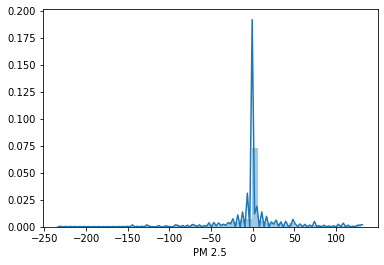

In [151]:
sns.distplot(Y_test - XGB_Randomized_predict )

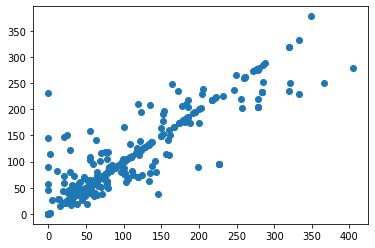

In [152]:
plt.scatter(Y_test, XGB_Randomized_predict)

## For XGBoost

In [153]:
print("Mean Absolute Error (MAE) for XGBoost : ", metrics.mean_absolute_error(Y_test, XGB_Randomized_predict))
print("Mean Squared Error (MSE) for XGBoost : ", metrics.mean_squared_error(Y_test, XGB_Randomized_predict))
print("Root Mean Squared Error (RMSE) for XGBoost : ", np.sqrt(metrics.mean_squared_error(Y_test, XGB_Randomized_predict)))

Mean Absolute Error (MAE) for XGBoost :  18.57384974743898
Mean Squared Error (MSE) for XGBoost :  1356.408863269895
Root Mean Squared Error (RMSE) for XGBoost :  36.82945646177656


## For Random Forest

In [154]:
print("Mean Absolute Error (MAE) for Random Forest : ", metrics.mean_absolute_error(Y_test, RF_predict))
print("Mean Squared Error (MSE) for Random Forest : ", metrics.mean_squared_error(Y_test, RF_predict))
print("Root Mean Squared Error (RMSE) for Random Forest : ", np.sqrt(metrics.mean_squared_error(Y_test, RF_predict)))

Mean Absolute Error (MAE) for Random Forest :  24.50873767741731
Mean Squared Error (MSE) for Random Forest :  1663.7060100578979
Root Mean Squared Error (RMSE) for Random Forest :  40.788552438863256


## Pickling -XGBoost

In [155]:
# open a file, where you want to store the data
file = open('XGBoost_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(XGB_Randomized_Search, file)

<IPython.core.display.Javascript object>

===================================================================================================================================================================

# Lets use PyCaret for a change

In [ ]:
# Importing module and initializing setup
from pycaret.regression import *
PyCaret_Reg = setup(data = df, target = 'PM 2.5')

IntProgress(value=0, description='Processing: ', max=13)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,02:04:05
Status,. . . . . . . . . . . . . . . . . .,Preparing Data for Modeling
ETC,. . . . . . . . . . . . . . . . . .,Calculating ETC


Text(value="Following data types have been inferred automatically, if they are correct press enter to continue…

,Data Type
T,Numeric
TM,Numeric
Tm,Numeric
SLP,Numeric
H,Numeric
VV,Numeric
V,Numeric
VM,Numeric
PM 2.5,Label
Log_PM2.5,Numeric


In [ ]:
df.head()

In [ ]:
# comparing all models
compare_models()

## What a wonderful thing to see, here in df we have both PM2.5 and log PM 2.5, hence there is severe multicollinearity and R^2 has reached 99%

In [ ]:
df.drop(['Log_PM2.5'],axis=1,inplace=True)

In [ ]:
df.head()

## Again running PyCaret.

In [ ]:
# Importing module and initializing setup
from pycaret.regression import *
PyCaret_Reg = setup(data = df, target = 'PM 2.5')

In [ ]:
# comparing all models
compare_models()

## Extra tree Regressor emerges as champion for this algorithm with 
## MAE- 19.071600, 
## MSE - 1261.205700, 
## RMSE - 34.839100, 
## R^2 - 0.818600
## Now lets apply this model.


In [ ]:
# creating xgboost model
Extra_tree_regressor = create_model('et')

In [ ]:
Extra_tree_regressor

In [ ]:
# Lets do some hyperparameter tuning
# tuning Extra Tree Regression Model
tuned_et = tune_model('et', n_iter = 100, optimize = 'mse')

In [ ]:
tuned_et

In [ ]:
et_predict_tuned = predict_model(tuned_et)

In [ ]:
et_predict_tuned

In [ ]:
et_predict_base = predict_model(Extra_tree_regressor)


In [ ]:
et_predict_base

In [ ]:
sns.distplot(Y - et_predict_base['Label'])

## Need to check TPOT ??

===================================================================================================================================================================

# K-NN Regresor

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

## Perform standard Scaling.

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

In [ ]:
scaler.fit(X_train)

In [ ]:
scaled_features= scaler.transform(X_train)

In [ ]:
X_train_feat = pd.DataFrame(scaled_features, columns=X_train.columns)

In [ ]:
X_train_feat.head()

In [ ]:
KNN_reg = KNeighborsRegressor(n_neighbors=1)
KNN_reg.fit(X_train_feat, Y_train)

In [ ]:
print("Coefficient of Determination R-Squared on train set using KNN regressor: {}".format(KNN_reg.score(X_train_feat,Y_train)))

## Overfitting.

In [ ]:
print("Coefficient of Determination R-Squared on test set using KNN regressor: {}".format(KNN_reg.score(X_test,Y_test)))

In [ ]:
from sklearn.model_selection import cross_val_score
KNN_score=cross_val_score(KNN_reg, X,Y,cv=5)

In [ ]:
KNN_score.mean()

## Model Evaluation

In [ ]:
KNN_pred = KNN_reg.predict(X_test)

In [ ]:
sns.distplot(Y_test - KNN_pred)

In [ ]:
plt.scatter(KNN_pred, Y_test)

In [ ]:
from sklearn import metrics
print("Mean Absolute Error (MAE) for KNN Regressor before tuning : ", metrics.mean_absolute_error(Y_test, KNN_pred))
print("Mean Squared Error (MSE) for KNN Regressor before tuning : ", metrics.mean_squared_error(Y_test, KNN_pred))
print("Root Mean Squared Error (RMSE) for KNN Regressor before tuning : ", np.sqrt(metrics.mean_squared_error(Y_test, KNN_pred)))

# Hyper-Parameter Tuning

In [ ]:
accuracy_rate = []  # List Declaration

for i in range(1,50):
    KNN_regh = KNeighborsRegressor(n_neighbors=i)
    score_cv_knn = cross_val_score(KNN_regh, X,Y,cv=15, scoring='neg_mean_squared_error')
    accuracy_rate.append(score_cv_knn.mean())

In [ ]:
#Plotting the best K value

plt.figure(figsize=(10,6))
plt.plot(range(1,50),accuracy_rate, color='green', linestyle='dashed', marker='o', markerfacecolor='cyan', markersize=10)
plt.title('Accuracy vs K-Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

## K=3 is the optimum K value where MSE is the lowest.

In [ ]:
KNN_reg_tuned = KNeighborsRegressor(n_neighbors=3)
KNN_reg_tuned.fit(X_train, Y_train)
KNN_predict_tuned = KNN_reg_tuned.predict(X_test)

In [ ]:
sns.distplot(Y_test - KNN_predict_tuned)

In [ ]:
plt.scatter(KNN_predict_tuned, Y_test)

In [ ]:
from sklearn import metrics
print("Mean Absolute Error (MAE) for KNN Regressor after tuning : ", metrics.mean_absolute_error(Y_test, KNN_predict_tuned))
print("Mean Squared Error (MSE) for KNN Regressor after tuning : ", metrics.mean_squared_error(Y_test, KNN_predict_tuned))
print("Root Mean Squared Error (RMSE) for KNN Regressor after tuning : ", np.sqrt(metrics.mean_squared_error(Y_test, KNN_predict_tuned)))

In [ ]:
!pip install xgboost